In [21]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

In [22]:
df = pd.read_csv('/kaggle/input/final-internship-data/final_internship_data.csv')

**User_ID**:  
A unique number for each user.  

**User Name**:  
The user's name.  

**Driver Name**:  
The driver's name.  

**Car Condition**:
The condition of the car (good or bad).  

**Weather**:  
Weather conditions (winter, windy, sunny).  

**Traffic Conditions**: 
Traffic status (congested or normal).  

**Key**:  
A unique number for each trip.  

**Fare Amount**:
The trip fare.  

**Pickup Datetime**:  
The time when the passenger requested Uber.  

**Pickup Longitude & Latitude**: 
The coordinates of the starting location (passenger's location).  

**Drop-off Longitude & Latitude**:  
The coordinates of the drop-off location (where the passenger arrived).  

**Passenger Count**:  
The number of passengers in the same car.  

**Hour, Day, Month, Week**:
Repeated time details of when the passenger requested Uber.  

**JFK, EWR, LGA Distance**:  
These are airport names; the distance between them and the pickup point.  

**SOL Distance**:
The distance to the Statue of Liberty.  

**Distance**:
The total trip distance.  

**Bearing**: 
The trip direction from start to end, measured in angles.

In [23]:
df.head()

,User ID,User Name,Driver Name,Car Condition,Weather,Traffic Condition,key,fare_amount,pickup_datetime,pickup_longitude,...,month,weekday,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing
0,KHVrEVlD,Kimberly Adams,Amy Butler,Very Good,windy,Congested Traffic,2009-06-15 17:26:21.0000001,4.5,2009-06-15 17:26:21,-1.288826,...,6,0,2009,20.265840,55.176046,14.342611,34.543548,27.572573,1.030764,-2.918897
1,lPxIuEri,Justin Tapia,Hannah Zimmerman,Excellent,cloudy,Flow Traffic,2010-01-05 16:52:16.0000002,16.9,2010-01-05 16:52:16,-1.291824,...,1,1,2010,44.667679,31.832358,23.130775,15.125872,8.755732,8.450134,-0.375217
2,gsVN8JLS,Elizabeth Lopez,Amanda Jackson,Bad,stormy,Congested Traffic,2011-08-18 00:35:00.00000049,5.7,2011-08-18 00:35:00,-1.291242,...,8,3,2011,43.597686,33.712082,19.865289,17.722624,9.847344,1.389525,2.599961
3,9I7kWFgd,Steven Wilson,Amy Horn,Very Good,stormy,Flow Traffic,2012-04-21 04:30:42.0000001,7.7,2012-04-21 04:30:42,-1.291319,...,4,5,2012,42.642965,32.556289,21.063132,15.738963,7.703421,2.799270,0.133905
4,8QN5ZaGN,Alexander Andrews,Cassandra Larson,Bad,stormy,Congested Traffic,2010-03-09 07:51:00.000000135,5.3,2010-03-09 07:51:00,-1.290987,...,3,1,2010,43.329953,39.406828,15.219339,23.732406,15.600745,1.999157,-0.502703


In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 26 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   User ID            500000 non-null  object 
 1   User Name          500000 non-null  object 
 2   Driver Name        500000 non-null  object 
 3   Car Condition      500000 non-null  object 
 4   Weather            500000 non-null  object 
 5   Traffic Condition  500000 non-null  object 
 6   key                500000 non-null  object 
 7   fare_amount        500000 non-null  float64
 8   pickup_datetime    500000 non-null  object 
 9   pickup_longitude   500000 non-null  float64
 10  pickup_latitude    500000 non-null  float64
 11  dropoff_longitude  499995 non-null  float64
 12  dropoff_latitude   499995 non-null  float64
 13  passenger_count    500000 non-null  int64  
 14  hour               500000 non-null  int64  
 15  day                500000 non-null  int64  
 16  mo

In [25]:
df.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,day,month,weekday,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing
count,500000.000000,500000.000000,500000.000000,499995.000000,499995.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,499995.000000,499995.000000,499995.000000,499995.000000,499995.000000,499995.000000,499995.000000
mean,11.358361,-1.265712,0.696740,-1.265755,0.696675,1.683428,13.510834,15.684206,6.268650,3.042008,2011.739132,385.279367,380.503657,363.843772,363.674038,355.991423,19.468775,0.297145
std,9.916617,0.206941,0.140909,0.205903,0.128997,1.307395,6.511571,8.681066,3.437815,1.949240,1.860889,2419.087483,2428.804740,2425.075903,2428.348683,2428.730839,367.299601,1.804548
min,-44.900000,-52.119764,-54.389440,-59.049665,-44.676047,0.000000,0.000000,1.000000,1.000000,0.000000,2009.000000,1.017646,1.460945,0.382119,0.532545,0.080500,0.000000,-3.141593
25%,6.000000,-1.291405,0.710958,-1.291393,0.710943,1.000000,9.000000,8.000000,3.000000,1.000000,2010.000000,41.341514,32.173712,17.100762,14.886989,7.147384,1.214550,-0.854721
50%,8.500000,-1.291226,0.711268,-1.291197,0.711277,1.000000,14.000000,16.000000,6.000000,3.000000,2012.000000,42.523163,34.787507,19.591554,18.347580,10.458151,2.116970,-0.050442
75%,12.500000,-1.290970,0.711520,-1.290908,0.711538,2.000000,19.000000,23.000000,9.000000,5.000000,2013.000000,43.785649,38.304502,22.214815,22.417812,14.448699,3.890070,2.206769
max,500.000000,37.360538,29.724576,0.712985,7.061893,6.000000,23.000000,31.000000,12.000000,6.000000,2015.000000,30133.067880,30167.595967,30167.285794,30159.407296,30162.285356,12399.956433,3.141593


In [26]:
df.describe(include='object')

,User ID,User Name,Driver Name,Car Condition,Weather,Traffic Condition,key,pickup_datetime
count,500000,500000,500000,500000,500000,500000,500000,500000
unique,500000,221675,221700,4,5,3,500000,461206
top,KHVrEVlD,Michael Smith,Michael Smith,Very Good,sunny,Congested Traffic,2009-06-15 17:26:21.0000001,2012-01-26 21:22:00
freq,1,224,257,125312,100433,166847,1,6


In [27]:
df.shape

(500000, 26)

In [28]:
df.columns

Index(['User ID', 'User Name', 'Driver Name', 'Car Condition', 'Weather',
       'Traffic Condition', 'key', 'fare_amount', 'pickup_datetime',
       'pickup_longitude', 'pickup_latitude', 'dropoff_longitude',
       'dropoff_latitude', 'passenger_count', 'hour', 'day', 'month',
       'weekday', 'year', 'jfk_dist', 'ewr_dist', 'lga_dist', 'sol_dist',
       'nyc_dist', 'distance', 'bearing'],
      dtype='object')

In [29]:
df.isnull().sum()

User ID              0
User Name            0
Driver Name          0
Car Condition        0
Weather              0
Traffic Condition    0
key                  0
fare_amount          0
pickup_datetime      0
pickup_longitude     0
pickup_latitude      0
dropoff_longitude    5
dropoff_latitude     5
passenger_count      0
hour                 0
day                  0
month                0
weekday              0
year                 0
jfk_dist             5
ewr_dist             5
lga_dist             5
sol_dist             5
nyc_dist             5
distance             5
bearing              5
dtype: int64

In [30]:
df.duplicated().sum()

0

In [32]:
df_cleaned = df.drop(['User ID', 'User Name', 'Driver Name','key'],axis = 1)

In [33]:
df_cleaned


,Car Condition,Weather,Traffic Condition,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,...,month,weekday,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing
0,Very Good,windy,Congested Traffic,4.5,2009-06-15 17:26:21,-1.288826,0.710721,-1.288779,0.710563,1,...,6,0,2009,20.265840,55.176046,14.342611,34.543548,27.572573,1.030764,-2.918897
1,Excellent,cloudy,Flow Traffic,16.9,2010-01-05 16:52:16,-1.291824,0.710546,-1.291182,0.711780,1,...,1,1,2010,44.667679,31.832358,23.130775,15.125872,8.755732,8.450134,-0.375217
2,Bad,stormy,Congested Traffic,5.7,2011-08-18 00:35:00,-1.291242,0.711418,-1.291391,0.711231,2,...,8,3,2011,43.597686,33.712082,19.865289,17.722624,9.847344,1.389525,2.599961
3,Very Good,stormy,Flow Traffic,7.7,2012-04-21 04:30:42,-1.291319,0.710927,-1.291396,0.711363,1,...,4,5,2012,42.642965,32.556289,21.063132,15.738963,7.703421,2.799270,0.133905
4,Bad,stormy,Congested Traffic,5.3,2010-03-09 07:51:00,-1.290987,0.711536,-1.290787,0.711811,1,...,3,1,2010,43.329953,39.406828,15.219339,23.732406,15.600745,1.999157,-0.502703
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499995,Bad,rainy,Dense Traffic,7.0,2015-05-07 18:45:12,-1.291173,0.711514,-1.290951,0.711371,1,...,5,3,2015,42.565403,36.580043,17.157511,20.401068,12.280187,1.404709,-2.275706
499996,Very Good,rainy,Flow Traffic,13.7,2010-09-13 12:11:34,-1.291595,0.710670,-1.291708,0.710540,1,...,9,0,2010,41.814877,27.833416,26.463167,8.596656,0.994796,0.994184,2.556931
499997,Bad,rainy,Flow Traffic,25.0,2014-08-25 00:22:20,-1.291262,0.710796,-1.289737,0.710366,1,...,8,0,2014,31.780108,38.960930,19.708214,19.066488,11.663395,7.859324,-1.926251
499998,Good,stormy,Congested Traffic,6.5,2015-01-12 12:17:32,-1.291101,0.711335,-1.291023,0.711480,6,...,1,0,2015,42.292914,36.382813,17.227166,20.006433,11.819775,0.994470,-0.384817


In [34]:
df_cleaned.describe(include='object')

,Car Condition,Weather,Traffic Condition,pickup_datetime
count,500000,500000,500000,500000
unique,4,5,3,461206
top,Very Good,sunny,Congested Traffic,2012-01-26 21:22:00
freq,125312,100433,166847,6


## Data Cleaning

In [35]:
# There are negative fare amount
# Remove negative fares
df_cleaned = df_cleaned[df_cleaned['fare_amount'] >= 0]

df_cleaned['fare_amount'].describe()


count    499979.000000
mean         11.359104
std           9.915980
min           0.000000
25%           6.000000
50%           8.500000
75%          12.500000
max         500.000000
Name: fare_amount, dtype: float64

In [37]:
# Drop  missing values 
df_cleaned = df_cleaned.dropna()
df_cleaned.isnull().sum().sum()


0

In [39]:
# Convert 'pickup_datetime' to datetime type
df_cleaned["pickup_datetime"] = pd.to_datetime(df_cleaned["pickup_datetime"],errors='coerce')

# Extract new time-based features
df_cleaned["pickup_hour"] = df_cleaned["pickup_datetime"].dt.hour
df_cleaned["pickup_day"] = df_cleaned["pickup_datetime"].dt.day
df_cleaned["pickup_month"] = df_cleaned["pickup_datetime"].dt.month
df_cleaned["pickup_year"] = df_cleaned["pickup_datetime"].dt.year
df_cleaned["pickup_weekday"] = df_cleaned["pickup_datetime"].dt.weekday
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 499974 entries, 0 to 499999
Data columns (total 27 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   Car Condition      499974 non-null  object        
 1   Weather            499974 non-null  object        
 2   Traffic Condition  499974 non-null  object        
 3   fare_amount        499974 non-null  float64       
 4   pickup_datetime    499974 non-null  datetime64[ns]
 5   pickup_longitude   499974 non-null  float64       
 6   pickup_latitude    499974 non-null  float64       
 7   dropoff_longitude  499974 non-null  float64       
 8   dropoff_latitude   499974 non-null  float64       
 9   passenger_count    499974 non-null  int64         
 10  hour               499974 non-null  int64         
 11  day                499974 non-null  int64         
 12  month              499974 non-null  int64         
 13  weekday            499974 non-null  int64        

In [40]:
df_cleaned = df_cleaned.drop(['pickup_datetime','hour','day','month','weekday','year'], axis = 1)
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 499974 entries, 0 to 499999
Data columns (total 21 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Car Condition      499974 non-null  object 
 1   Weather            499974 non-null  object 
 2   Traffic Condition  499974 non-null  object 
 3   fare_amount        499974 non-null  float64
 4   pickup_longitude   499974 non-null  float64
 5   pickup_latitude    499974 non-null  float64
 6   dropoff_longitude  499974 non-null  float64
 7   dropoff_latitude   499974 non-null  float64
 8   passenger_count    499974 non-null  int64  
 9   jfk_dist           499974 non-null  float64
 10  ewr_dist           499974 non-null  float64
 11  lga_dist           499974 non-null  float64
 12  sol_dist           499974 non-null  float64
 13  nyc_dist           499974 non-null  float64
 14  distance           499974 non-null  float64
 15  bearing            499974 non-null  float64
 16  pickup_

In [41]:
df_cleaned['distance'].describe()

count    499974.000000
mean         19.452227
std         367.104560
min           0.000000
25%           1.214637
50%           2.116997
75%           3.890147
max       12399.956433
Name: distance, dtype: float64

In [42]:
# Remove unrealistic distances (e.g., greater than 100 km)
df_cleaned = df_cleaned[df_cleaned['distance'] <= 100]
df_cleaned['distance'].describe()

count    498883.000000
mean          3.271060
std           3.734449
min           0.000000
25%           1.213044
50%           2.112360
75%           3.870059
max          99.876304
Name: distance, dtype: float64

In [43]:
categoricl_cols = df_cleaned.select_dtypes(include='object')
numerical_cols = df_cleaned.select_dtypes(exclude='object')

In [44]:
categoricl_cols.info()

<class 'pandas.core.frame.DataFrame'>
Index: 498883 entries, 0 to 499999
Data columns (total 3 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   Car Condition      498883 non-null  object
 1   Weather            498883 non-null  object
 2   Traffic Condition  498883 non-null  object
dtypes: object(3)
memory usage: 15.2+ MB


In [45]:
numerical_cols.info()

<class 'pandas.core.frame.DataFrame'>
Index: 498883 entries, 0 to 499999
Data columns (total 18 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   fare_amount        498883 non-null  float64
 1   pickup_longitude   498883 non-null  float64
 2   pickup_latitude    498883 non-null  float64
 3   dropoff_longitude  498883 non-null  float64
 4   dropoff_latitude   498883 non-null  float64
 5   passenger_count    498883 non-null  int64  
 6   jfk_dist           498883 non-null  float64
 7   ewr_dist           498883 non-null  float64
 8   lga_dist           498883 non-null  float64
 9   sol_dist           498883 non-null  float64
 10  nyc_dist           498883 non-null  float64
 11  distance           498883 non-null  float64
 12  bearing            498883 non-null  float64
 13  pickup_hour        498883 non-null  int32  
 14  pickup_day         498883 non-null  int32  
 15  pickup_month       498883 non-null  int32  
 16  pickup_

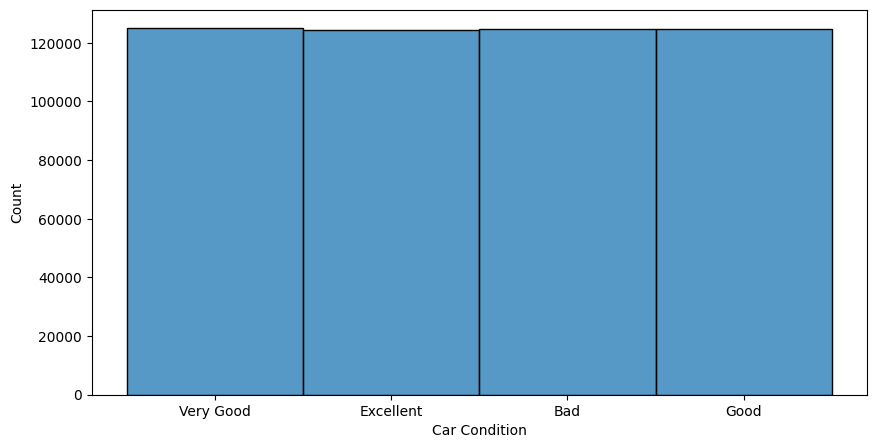

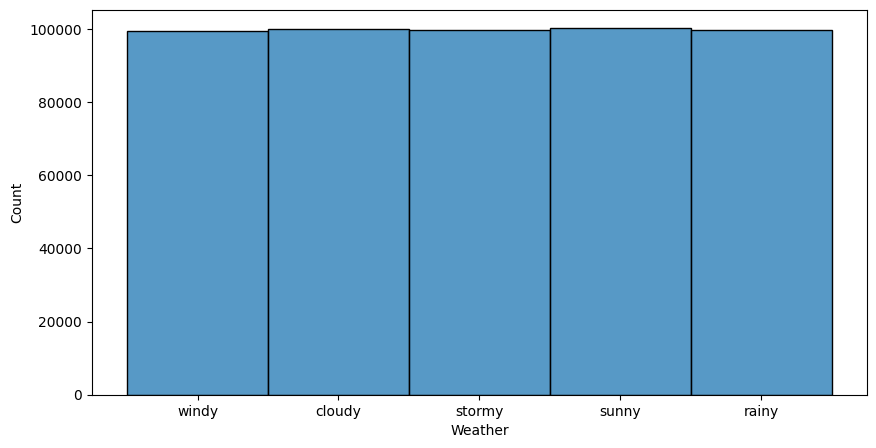

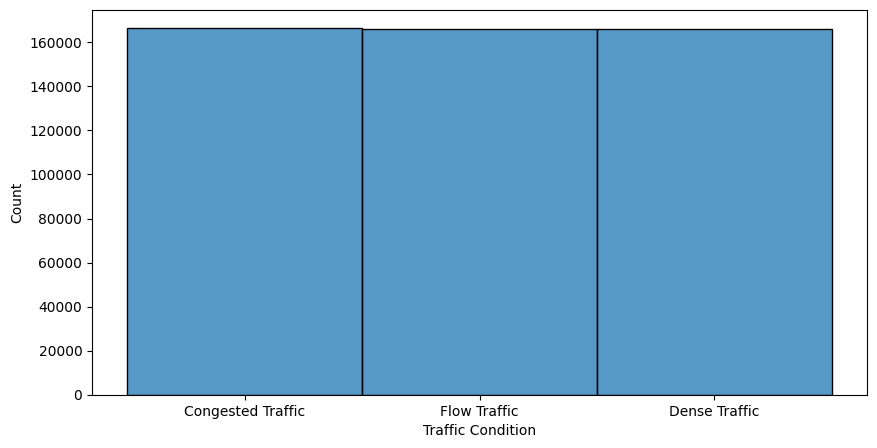

In [46]:
for col in categoricl_cols:
  plt.figure(figsize=(10,5))
  sns.histplot(df_cleaned,x=col)
  plt.show()


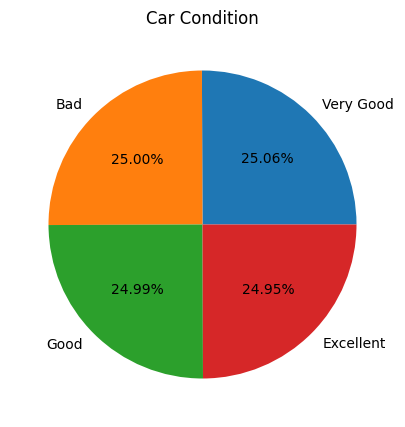

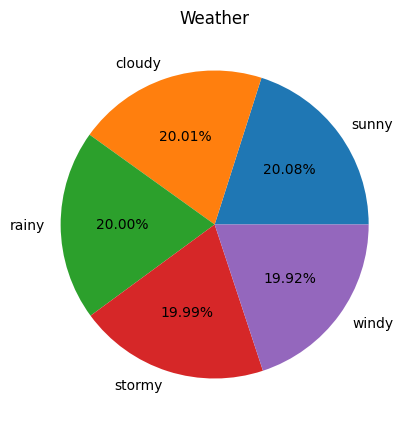

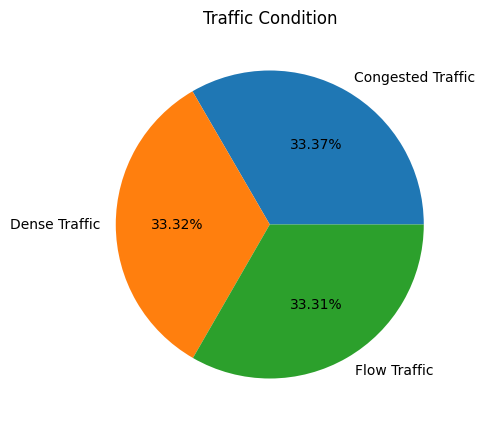

In [48]:
for col in categoricl_cols:
  plt.figure(figsize=(10,5))
  plt.pie(df_cleaned[col].value_counts(),labels=df_1[col].value_counts().index,autopct='%1.2f%%')
  plt.title(col)
  plt.show()


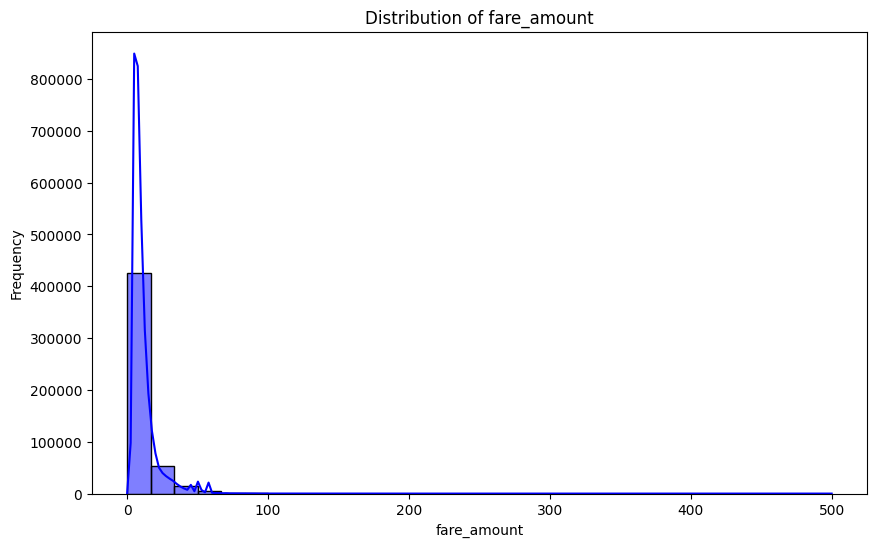

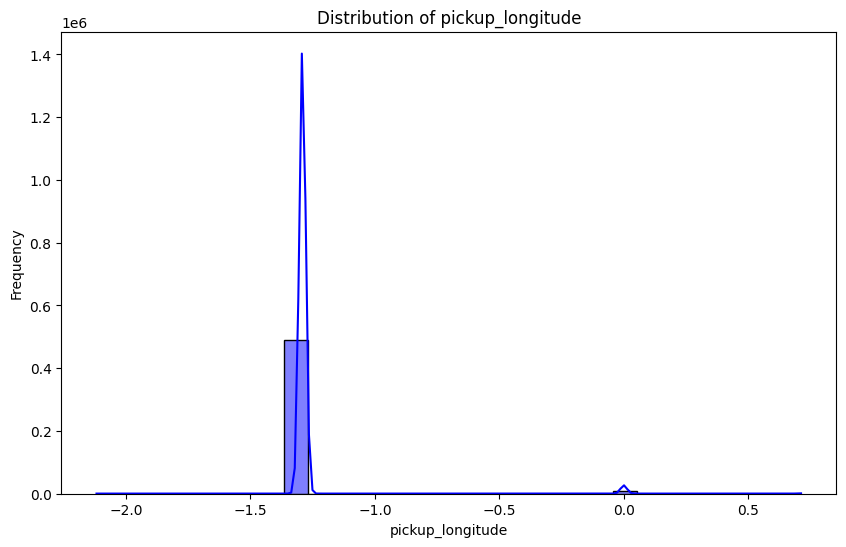

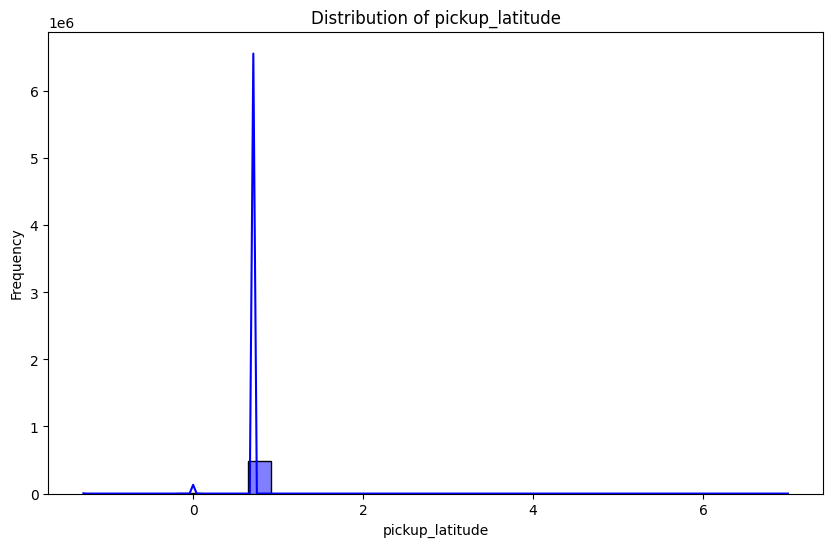

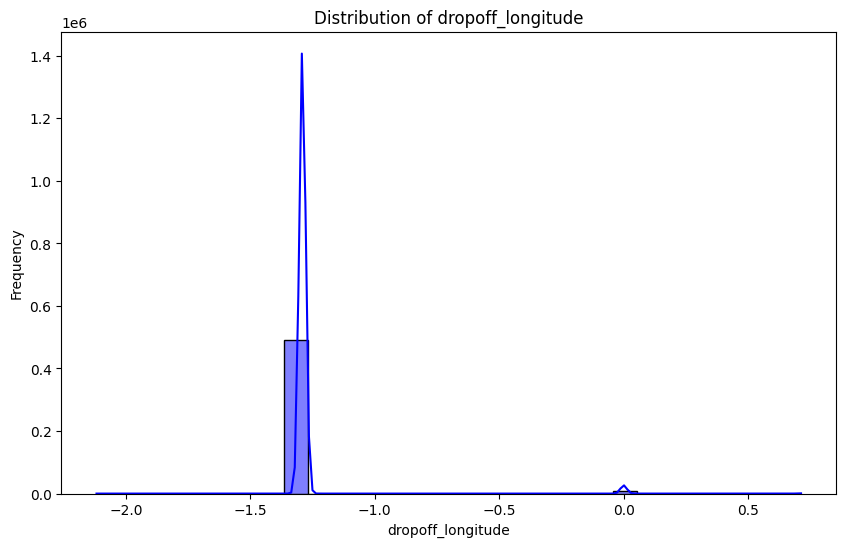

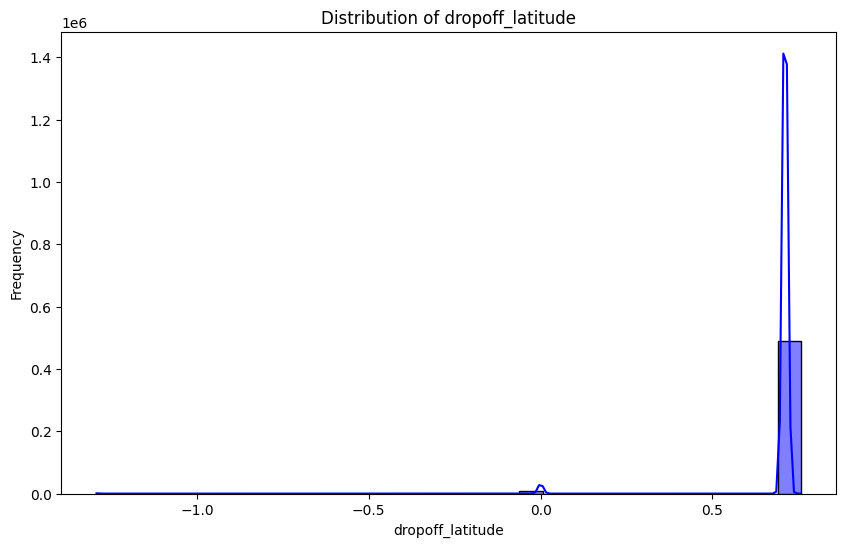

...

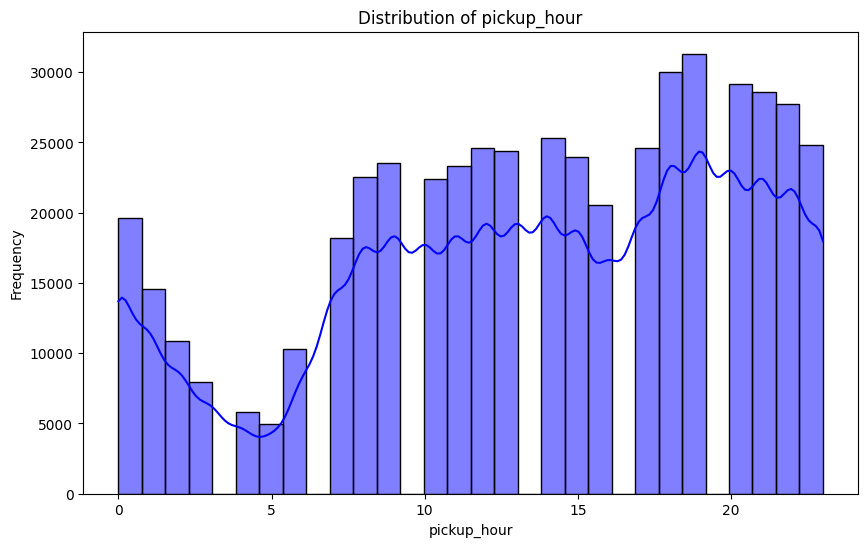

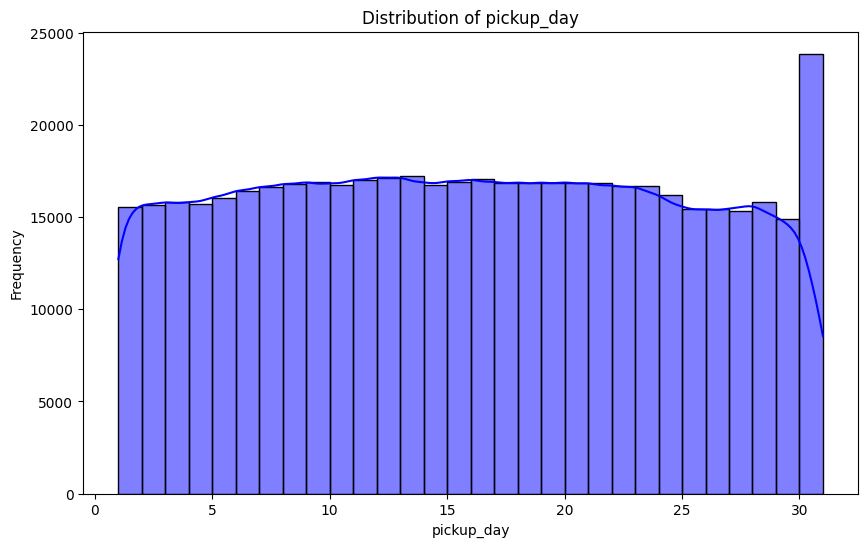

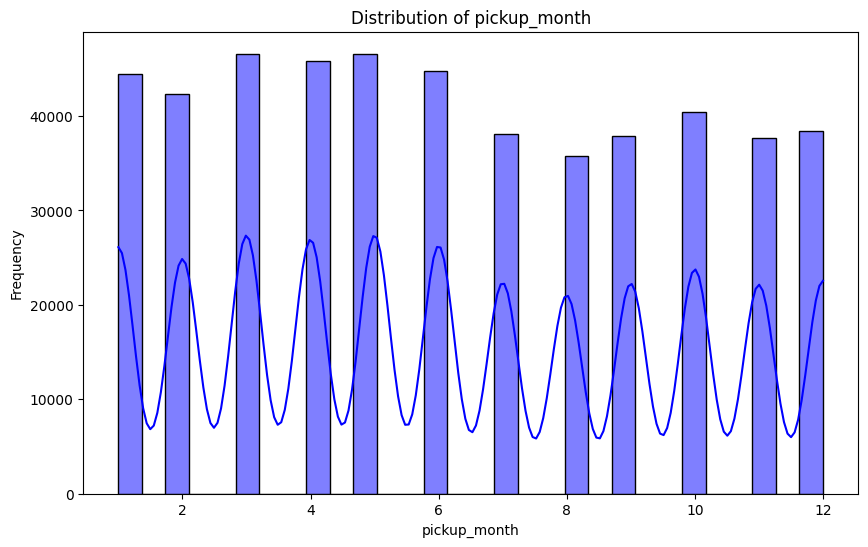

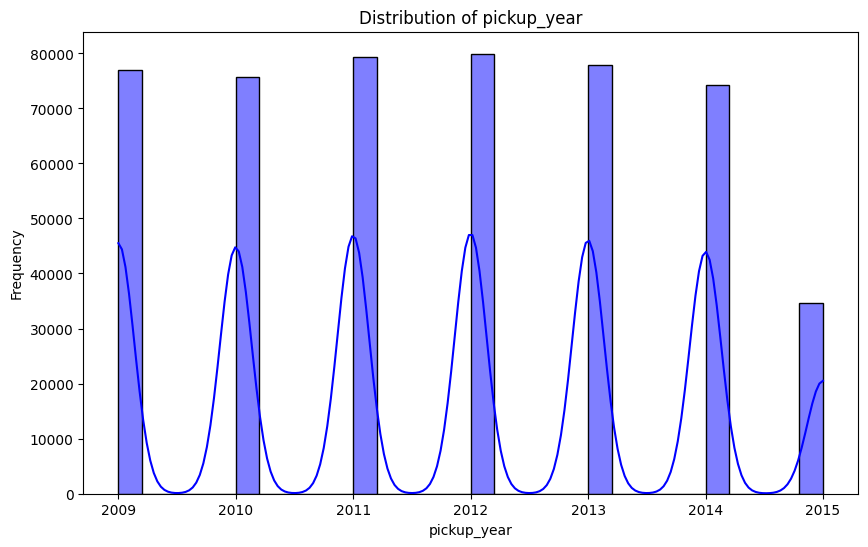

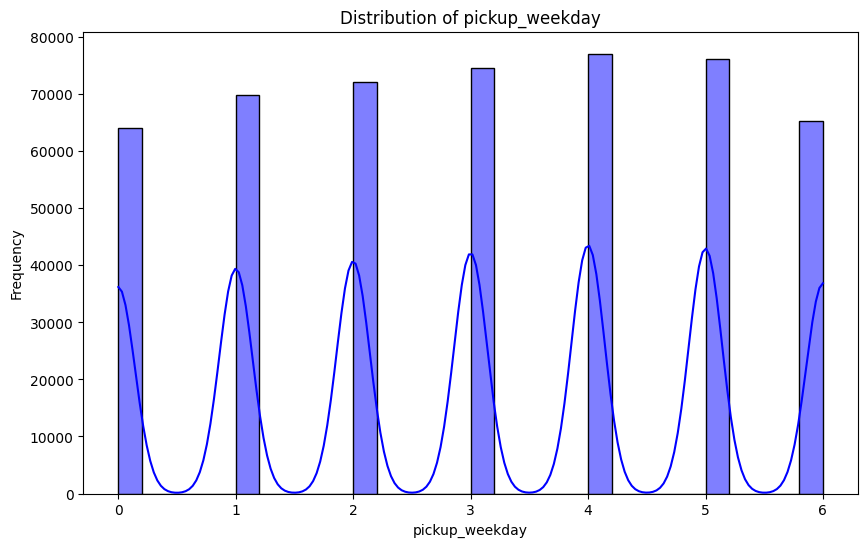

In [50]:
for col in numerical_cols:
  plt.figure(figsize=(10, 6))

  sns.histplot(df_cleaned[col], bins=30, kde=True, color='blue')
  plt.title(f'Distribution of {col}')
  plt.xlabel(f'{col}')
  plt.ylabel('Frequency')
  plt.show()


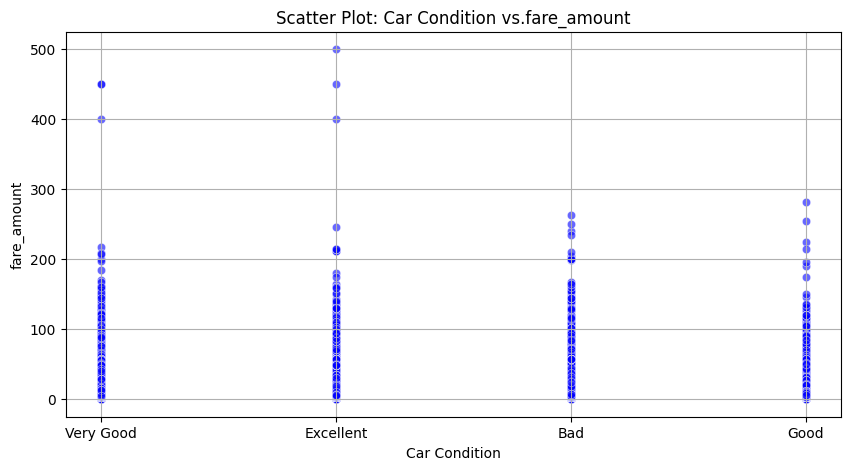

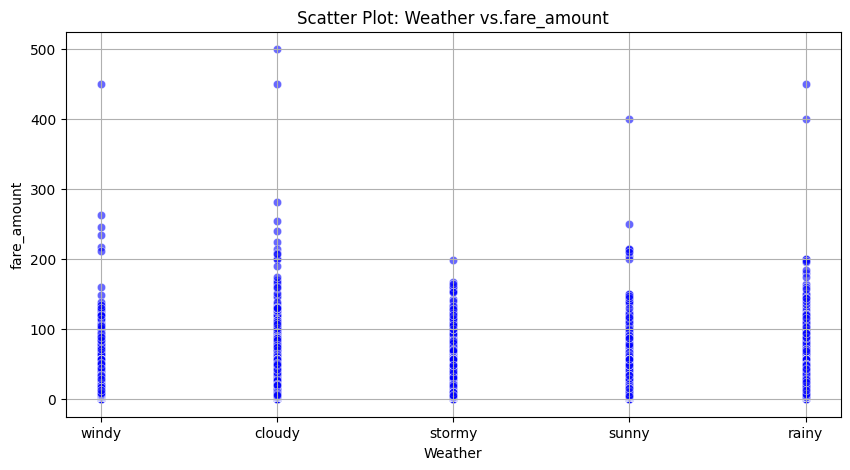

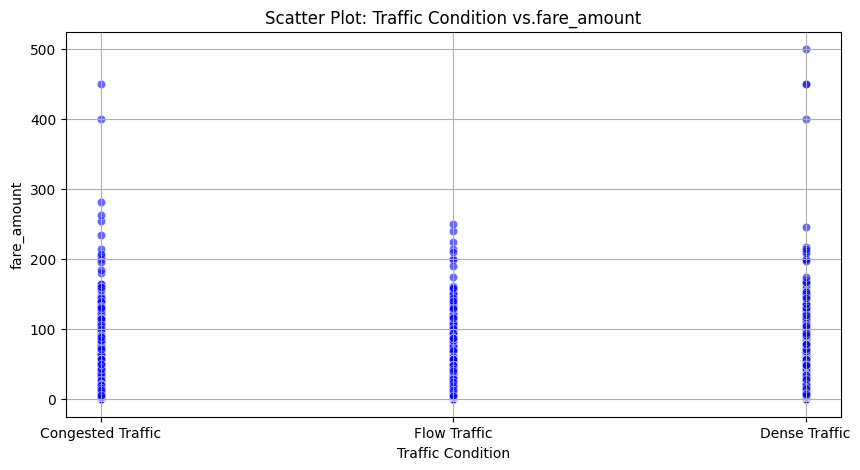

In [51]:
for col in categoricl_cols:

  plt.figure(figsize=(10, 5))
  sns.scatterplot(x=df_cleaned[col], y=df_cleaned['fare_amount'], alpha=0.6, color='blue')

  # Titles and labels
  plt.title(f'Scatter Plot: {col} vs.fare_amount')
  plt.xlabel(col)
  plt.ylabel('fare_amount')
  plt.grid(True)

  plt.show()


In [55]:
for col in numerical_cols:
    print(df_cleaned[col].quantile([0.7,0.8,0.9,0.95,0.99,0.995,0.999,1]))
    print("-------------------------")
    print(' ')

0.700     11.50
0.800     14.10
0.900     20.50
0.950     30.50
0.990     52.00
0.995     57.33
0.999     80.00
1.000    500.00
Name: fare_amount, dtype: float64
-------------------------
 
0.700   -1.291042
0.800   -1.290883
0.900   -1.290689
0.950   -1.289324
0.990    0.000000
0.995    0.000000
0.999    0.000000
1.000    0.712319
Name: pickup_longitude, dtype: float64
-------------------------
 
0.700    0.711465
0.800    0.711586
0.900    0.711740
0.950    0.711879
0.990    0.712213
0.995    0.712357
0.999    0.713077
1.000    7.000225
Name: pickup_latitude, dtype: float64
-------------------------
 
0.700   -1.291000
0.800   -1.290819
0.900   -1.290592
0.950   -1.289438
0.990    0.000000
0.995    0.000000
0.999    0.000000
1.000    0.712985
Name: dropoff_longitude, dtype: float64
-------------------------
 
0.700    0.711473
0.800    0.711614
0.900    0.711794
0.950    0.711986
0.990    0.712644
0.995    0.713005
0.999    0.713747
1.000    0.757738
Name: dropoff_latitude, dtype: fl

In [59]:
def outliers_handling(x, p1=0.25, p2=0.75):
    q1= x.quantile(p1)
    q3= x.quantile(p2)

    iqr = q3 - q1
    min_limit = (q1 - 1.5 * iqr)
    max_limit = (q3 + 1.5 * iqr)
    # Upper bound
    upper = df_cleaned[x >= max_limit].index
    # Lower bound
    lower = df_cleaned[x <= min_limit].index
    
    # Removing the Outliers
    df_cleaned.drop(upper, inplace = True)
    df_cleaned.drop(lower, inplace = True)

In [60]:
for col in numerical_cols:
    outliers_handling(df_cleaned[col])

In [65]:
for col in numerical_cols:
    print(df_cleaned[col].quantile([0.7,0.8,0.9,0.95,0.99,0.995,0.999,1]))
    print("-------------------------")
    print(' ')

0.700     9.5
0.800    10.9
0.900    13.0
0.950    15.0
0.990    19.0
0.995    20.0
0.999    21.5
1.000    22.1
Name: fare_amount, dtype: float64
-------------------------
 
0.700   -1.291106
0.800   -1.290993
0.900   -1.290829
0.950   -1.290740
0.990   -1.290620
0.995   -1.290589
0.999   -1.290485
1.000   -1.290395
Name: pickup_longitude, dtype: float64
-------------------------
 
0.700    0.711456
0.800    0.711560
0.900    0.711716
0.950    0.711811
0.990    0.712003
0.995    0.712092
0.999    0.712206
1.000    0.712281
Name: pickup_latitude, dtype: float64
-------------------------
 
0.700   -1.291100
0.800   -1.290989
0.900   -1.290810
0.950   -1.290726
0.990   -1.290597
0.995   -1.290543
0.999   -1.290460
1.000   -1.290408
Name: dropoff_longitude, dtype: float64
-------------------------
 
0.700    0.711460
0.800    0.711576
0.900    0.711733
0.950    0.711840
0.990    0.712077
0.995    0.712163
0.999    0.712241
1.000    0.712316
Name: dropoff_latitude, dtype: float64
----------

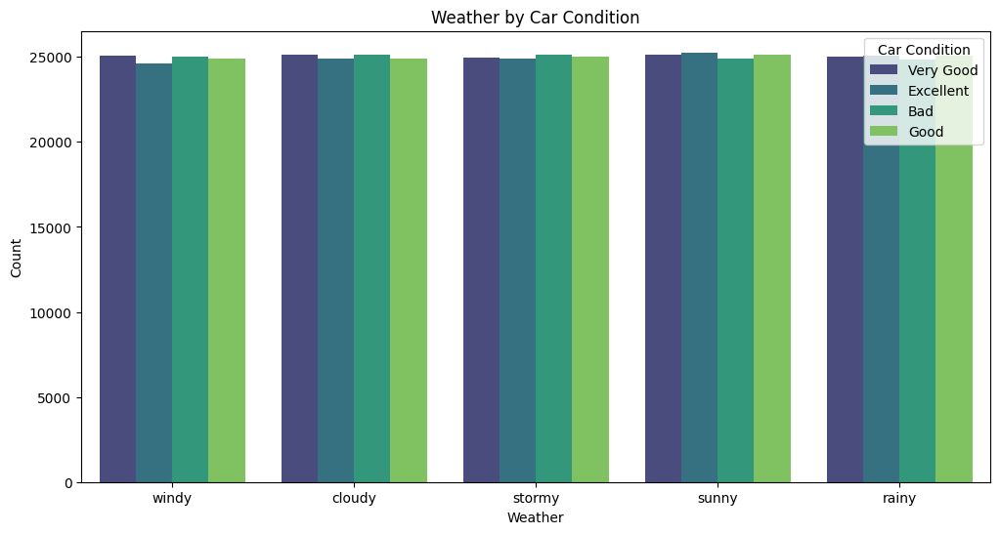

In [61]:
plt.figure(figsize=(12, 6))
sns.countplot(x='Weather', hue='Car Condition', data=df_1, palette='viridis')
plt.title('Weather by Car Condition')
plt.xlabel('Weather')
plt.ylabel('Count')
plt.legend(title='Car Condition')
plt.show()

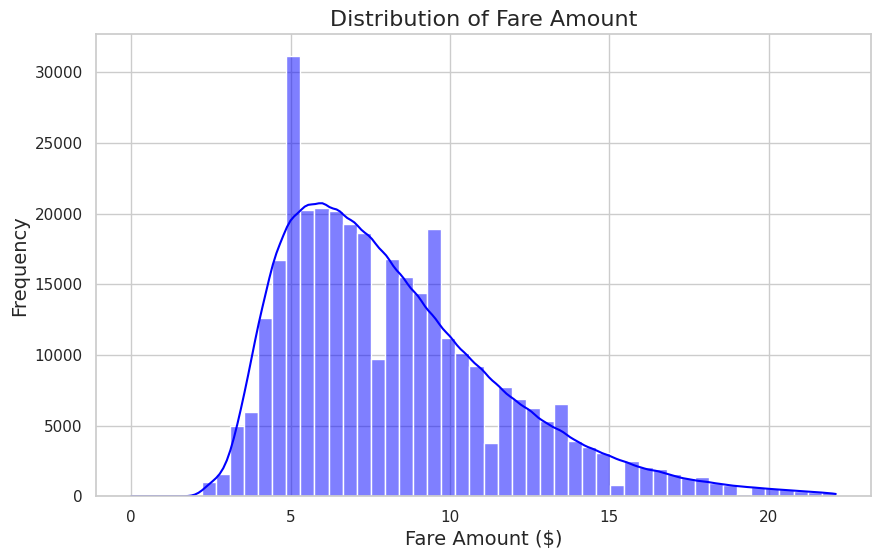

In [62]:
sns.set(style="whitegrid")

# Create the histogram
plt.figure(figsize=(10, 6))  # Set the figure size
sns.histplot(df_cleaned['fare_amount'], bins=50, kde=True, color='blue')

# Add title and labels
plt.title('Distribution of Fare Amount', fontsize=16)
plt.xlabel('Fare Amount ($)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

# Show the plot
plt.show()


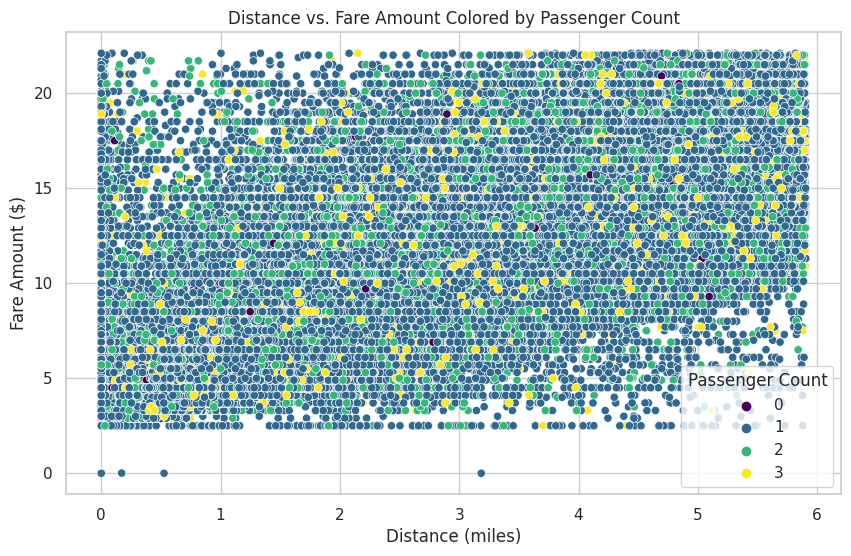

In [64]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_cleaned, x='distance', y='fare_amount', hue='passenger_count', palette='viridis')
plt.title('Distance vs. Fare Amount Colored by Passenger Count')
plt.xlabel('Distance (miles)')
plt.ylabel('Fare Amount ($)')
plt.legend(title='Passenger Count')
plt.show()


In [66]:
!pip install matplotlib contextily

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 68.5 MB/s eta 0:00:00:00:0100:01


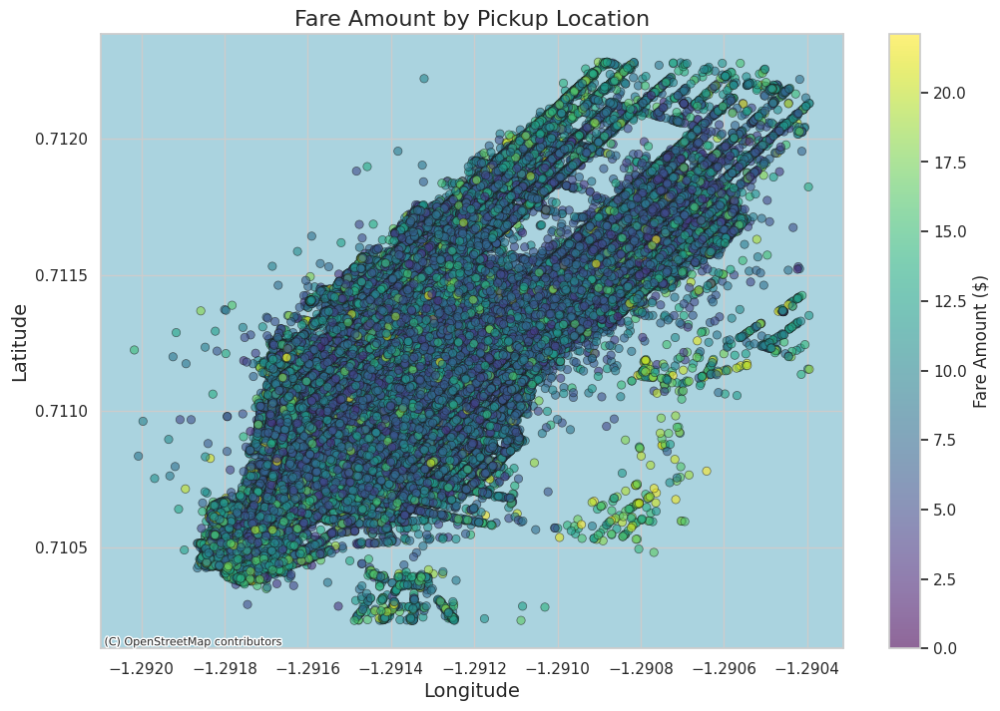

In [69]:
import contextily as ctx

# Create the plot
plt.figure(figsize=(12, 8))

# Scatter plot for pickup locations
scatter = plt.scatter(df_cleaned['pickup_longitude'], df_cleaned['pickup_latitude'], c=df_cleaned['fare_amount'], 
                      cmap='viridis', alpha=0.6, edgecolor='k', linewidth=0.5)

# Add a colorbar
cbar = plt.colorbar(scatter)
cbar.set_label('Fare Amount ($)')

# Add a basemap using contextily
ctx.add_basemap(plt.gca(), crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik)

# Set title and labels
plt.title('Fare Amount by Pickup Location', fontsize=16)
plt.xlabel('Longitude', fontsize=14)
plt.ylabel('Latitude', fontsize=14)

# Show the plot
plt.show()

In [ ]:
fig = px.scatter_mapbox(df, lat='pickup_latitude', lon='pickup_longitude', color='fare_amount',
                       title='Fare Amount by Pickup Location', mapbox_style='open-street-map')
fig.show()

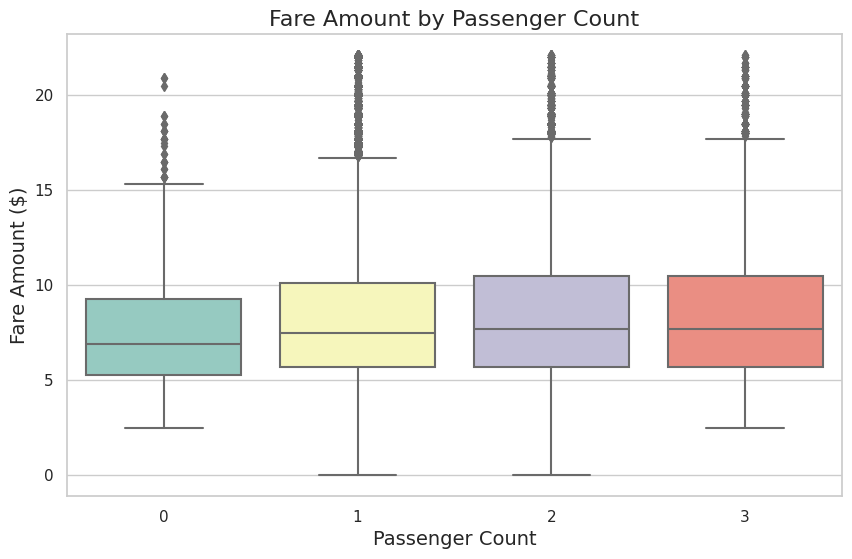

In [70]:
plt.figure(figsize=(10, 6))  # Set the figure size
sns.boxplot(data=df_cleaned, x='passenger_count', y='fare_amount', palette='Set3')

# Add title and labels
plt.title('Fare Amount by Passenger Count', fontsize=16)
plt.xlabel('Passenger Count', fontsize=14)
plt.ylabel('Fare Amount ($)', fontsize=14)

# Show the plot
plt.show()

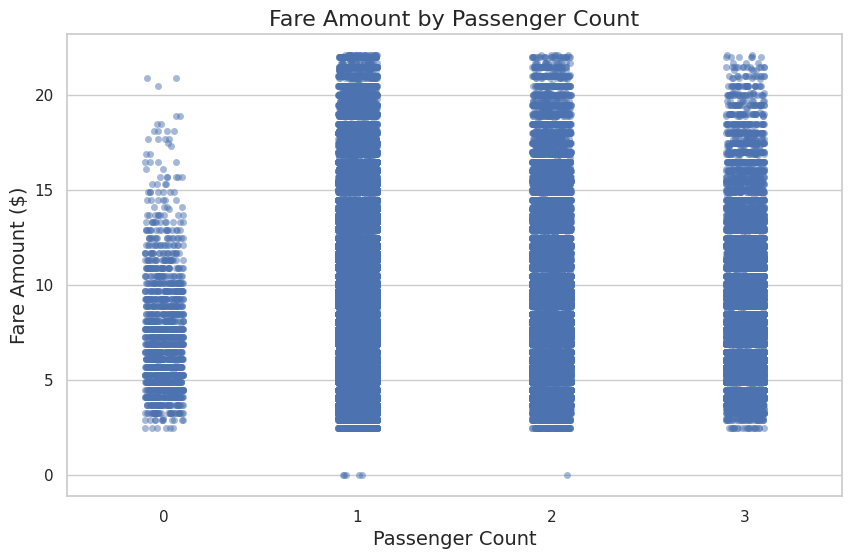

In [71]:
# plt.figure(figsize=(10, 6))
# sns.swarmplot(data=df, x='passenger_count', y='fare_amount', color='black', alpha=0.5)
# plt.title('Fare Amount by Passenger Count', fontsize=16)
# plt.xlabel('Passenger Count', fontsize=14)
# plt.ylabel('Fare Amount ($)', fontsize=14)
# plt.show()
plt.figure(figsize=(10, 6))
sns.stripplot(data=df_cleaned, x='passenger_count', y='fare_amount', alpha=0.5, jitter=True)
plt.title('Fare Amount by Passenger Count', fontsize=16)
plt.xlabel('Passenger Count', fontsize=14)
plt.ylabel('Fare Amount ($)', fontsize=14)
plt.show()

In [ ]:
fig = px.box(df, x='passenger_count', y='fare_amount', color='passenger_count',
             title='Fare Amount by Passenger Count',
             color_discrete_sequence=px.colors.qualitative.Set3)  # Qualitative color scale
fig.show()

In [ ]:
fig = px.box(df, x='Weather', y='fare_amount', color='Weather',
             title='Fare Amount by Weather Condition',
             color_discrete_sequence=px.colors.qualitative.Pastel)  # Qualitative color scale
fig.show()

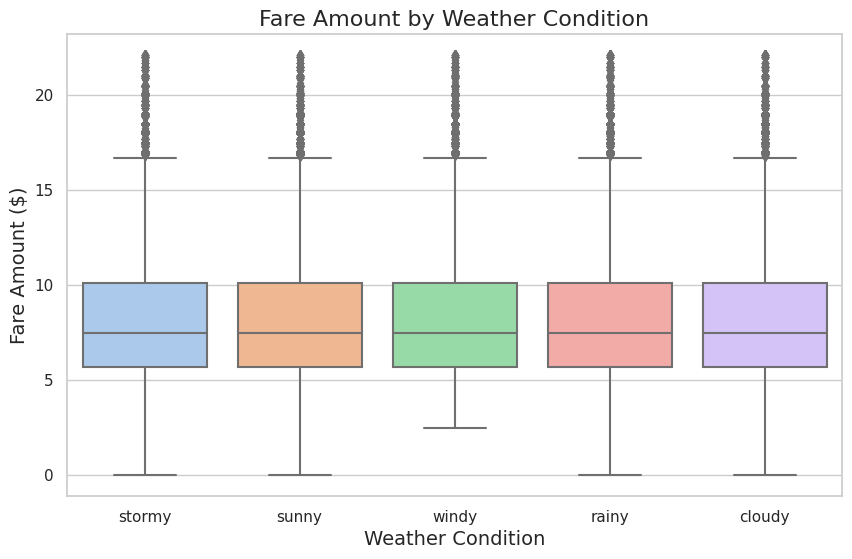

In [72]:
sns.set(style="whitegrid")

# Create the box plot
plt.figure(figsize=(10, 6))  # Set the figure size
sns.boxplot(data=df_cleaned, x='Weather', y='fare_amount', palette='pastel')

# Add title and labels
plt.title('Fare Amount by Weather Condition', fontsize=16)
plt.xlabel('Weather Condition', fontsize=14)
plt.ylabel('Fare Amount ($)', fontsize=14)

# Show the plot
plt.show()

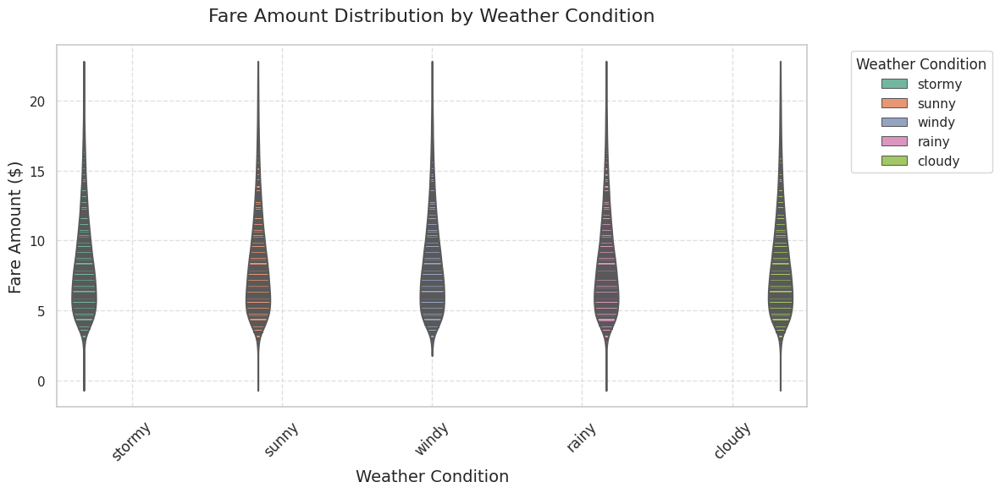

In [123]:
plt.figure(figsize=(12, 6))

# Create the violin plot
sns.violinplot(x="Weather", y="fare_amount", data=df_cleaned, inner="stick", hue="Weather",  palette="Set2",  linewidth=1.5,   
    saturation=0.75  
)

# Add title and labels
plt.title("Fare Amount Distribution by Weather Condition", fontsize=16, pad=20)
plt.xlabel("Weather Condition", fontsize=14)
plt.ylabel("Fare Amount ($)", fontsize=14)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, fontsize=12)

# Add grid lines for better readability
plt.grid(True, linestyle='--', alpha=0.6)

# Add a legend (optional, since hue is used)
plt.legend(title="Weather Condition", bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout to prevent overlapping
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
fig = px.box(df, x='Car Condition', y='fare_amount', color='Car Condition',
             title='Fare Amount by Car Condition',
             color_discrete_sequence=px.colors.qualitative.Dark24)  # Qualitative color scale
fig.show()

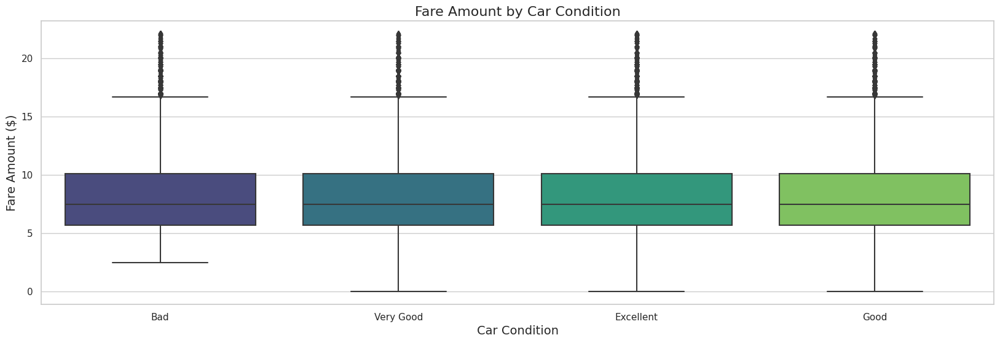

In [73]:
sns.set(style="whitegrid")

# Create the box plot
plt.figure(figsize=(20, 6))  # Set the figure size
sns.boxplot(data=df_cleaned, x='Car Condition', y='fare_amount', palette='viridis')

# Add title and labels
plt.title('Fare Amount by Car Condition', fontsize=16)
plt.xlabel('Car Condition', fontsize=14)
plt.ylabel('Fare Amount ($)', fontsize=14)

# Show the plot
plt.show()

In [ ]:
fig = px.scatter(df, x='bearing', y='fare_amount', color='fare_amount',
                 title='Fare Amount vs. Bearing',
                 color_continuous_scale=px.colors.sequential.Inferno)  # Color scale
fig.show()

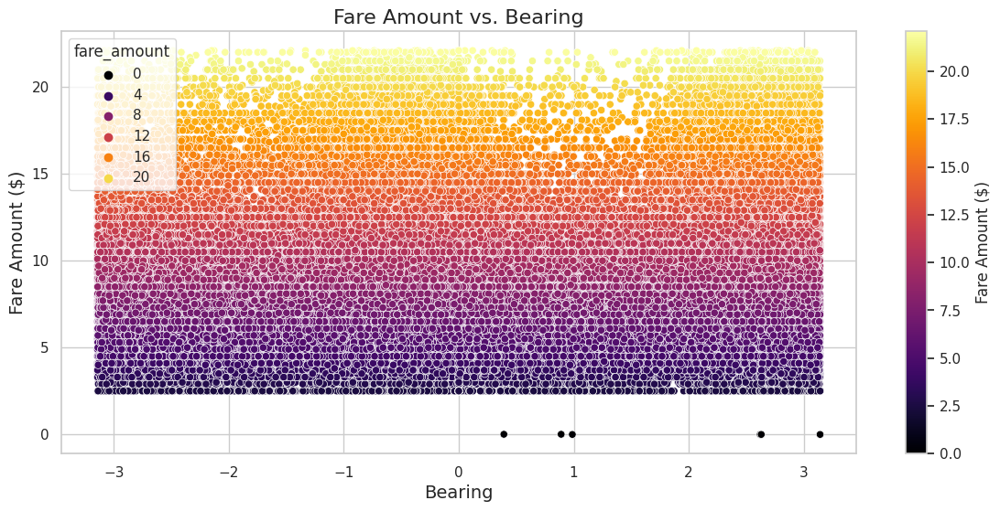

In [75]:
sns.set(style="whitegrid")

# Create the scatter plot
plt.figure(figsize=(14, 6))  # Set the figure size
scatter = sns.scatterplot(data=df_cleaned, x='bearing', y='fare_amount', hue='fare_amount', palette='inferno')

# Add title and labels
plt.title('Fare Amount vs. Bearing', fontsize=16)
plt.xlabel('Bearing', fontsize=14)
plt.ylabel('Fare Amount ($)', fontsize=14)

# Add a colorbar
norm = plt.Normalize(df_cleaned['fare_amount'].min(), df_cleaned['fare_amount'].max())
sm = plt.cm.ScalarMappable(cmap='inferno', norm=norm)
sm.set_array([])
plt.colorbar(sm, label='Fare Amount ($)')

# Show the plot
plt.show()

In [ ]:

# # Compute correlation matrix
# corr = df.corr()

# # Plot heatmap
# fig = px.imshow(corr, text_auto=True, title='Correlation Heatmap',
#                 color_continuous_scale=px.colors.diverging.RdBu)  # Diverging color scale
# fig.show()

In [ ]:
# Group by date and calculate average fare amount
df['pickup_datetime'] = pd.to_datetime(df['pickup_datetime'])
df_date = df.groupby(df['pickup_datetime'].dt.date)['fare_amount'].mean().reset_index()

# Plot
fig = px.line(df_date, x='pickup_datetime', y='fare_amount', title='Average Fare Amount Over Time',
              color_discrete_sequence=['#ff7f0e'])  # Single color
fig.show()

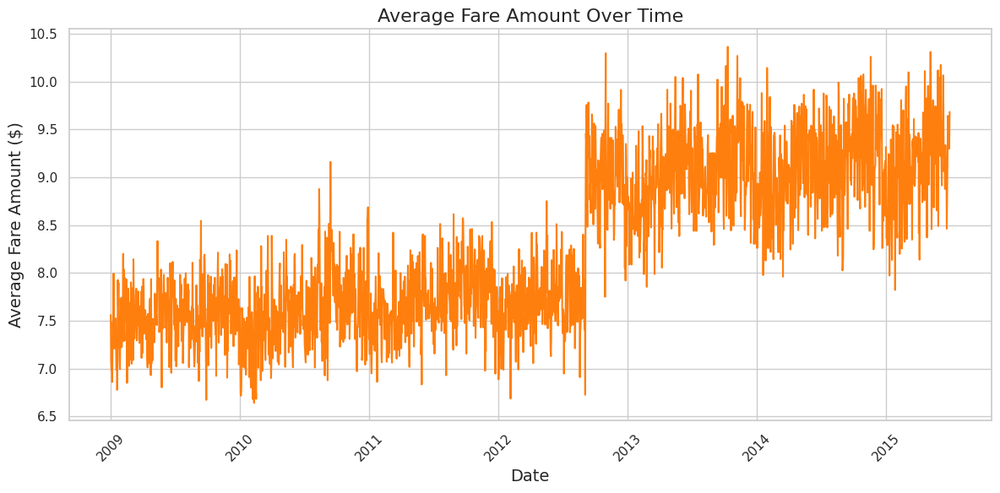

In [76]:
df['pickup_datetime'] = pd.to_datetime(df['pickup_datetime'])
df_date = df_cleaned.groupby(df['pickup_datetime'].dt.date)['fare_amount'].mean().reset_index()

# Set the style for the plot
sns.set(style="whitegrid")

# Create the line plot
plt.figure(figsize=(12, 6))  # Set the figure size
sns.lineplot(data=df_date, x='pickup_datetime', y='fare_amount', color='#ff7f0e')

# Add title and labels
plt.title('Average Fare Amount Over Time', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Average Fare Amount ($)', fontsize=14)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()

In [120]:
df['pickup_datetime']

0        2009-06-15 17:26:21
1        2010-01-05 16:52:16
2        2011-08-18 00:35:00
3        2012-04-21 04:30:42
4        2010-03-09 07:51:00
                 ...        
499995   2015-05-07 18:45:12
499996   2010-09-13 12:11:34
499997   2014-08-25 00:22:20
499998   2015-01-12 12:17:32
499999   2010-04-12 23:46:58
Name: pickup_datetime, Length: 500000, dtype: datetime64[ns]

In [122]:
df_date 


,pickup_datetime,fare_amount
0,2009-01-01,9.773734
1,2009-01-02,10.591667
2,2009-01-03,10.822778
3,2009-01-04,11.470710
4,2009-01-05,9.439259
...,...,...
2367,2015-06-26,13.556321
2368,2015-06-27,11.277333
2369,2015-06-28,15.147500
2370,2015-06-29,14.019660


In [ ]:
# Top 10 Drivers by Average Fare Amount
top_drivers = df.groupby('Driver Name')['fare_amount'].mean().nlargest(10).reset_index()

# Plot
fig = px.bar(top_drivers, x='Driver Name', y='fare_amount', color='Driver Name',
             title='Top 10 Drivers by Average Fare Amount',
             color_discrete_sequence=px.colors.qualitative.Alphabet)  # Qualitative color scale
fig.show()

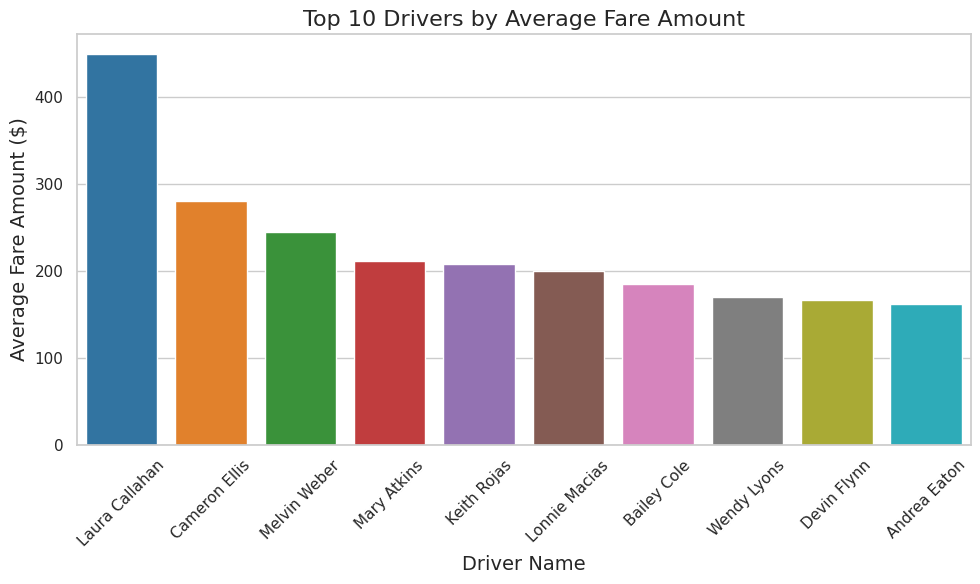

In [84]:
top_drivers = df.groupby('Driver Name')['fare_amount'].mean().nlargest(10).reset_index()

# Set the style for the plot
sns.set(style="whitegrid")

# Create the bar plot
plt.figure(figsize=(10, 6))  # Set the figure size
sns.barplot(data=top_drivers, x='Driver Name', y='fare_amount', palette='tab10')

# Add title and labels
plt.title('Top 10 Drivers by Average Fare Amount', fontsize=16)
plt.xlabel('Driver Name', fontsize=14)
plt.ylabel('Average Fare Amount ($)', fontsize=14)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()

In [ ]:
fig = px.scatter(df, x='jfk_dist', y='fare_amount', color='fare_amount',
                 title='Fare Amount vs. Distance to JFK',
                 color_continuous_scale=px.colors.sequential.Magma)  # Color scale
fig.show()

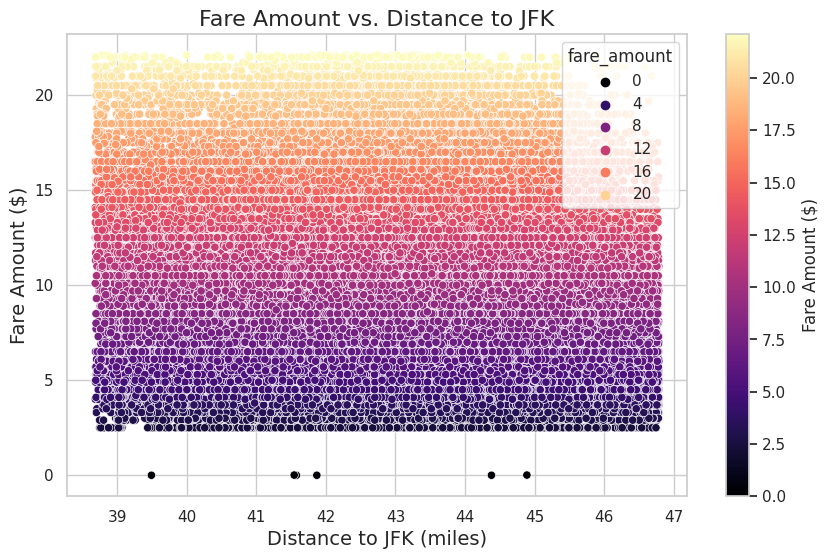

In [79]:
sns.set(style="whitegrid")

# Create the scatter plot
plt.figure(figsize=(10, 6))  # Set the figure size
scatter = sns.scatterplot(data=df_cleaned, x='jfk_dist', y='fare_amount', hue='fare_amount', palette='magma')

# Add title and labels
plt.title('Fare Amount vs. Distance to JFK', fontsize=16)
plt.xlabel('Distance to JFK (miles)', fontsize=14)
plt.ylabel('Fare Amount ($)', fontsize=14)

# Add a colorbar
norm = plt.Normalize(df_cleaned['fare_amount'].min(), df_cleaned['fare_amount'].max())
sm = plt.cm.ScalarMappable(cmap='magma', norm=norm)
sm.set_array([])
plt.colorbar(sm, label='Fare Amount ($)')

# Show the plot
plt.show()

In [86]:
df.columns

Index(['User ID', 'User Name', 'Driver Name', 'Car Condition', 'Weather',
       'Traffic Condition', 'key', 'fare_amount', 'pickup_datetime',
       'pickup_longitude', 'pickup_latitude', 'dropoff_longitude',
       'dropoff_latitude', 'passenger_count', 'hour', 'day', 'month',
       'weekday', 'year', 'jfk_dist', 'ewr_dist', 'lga_dist', 'sol_dist',
       'nyc_dist', 'distance', 'bearing'],
      dtype='object')

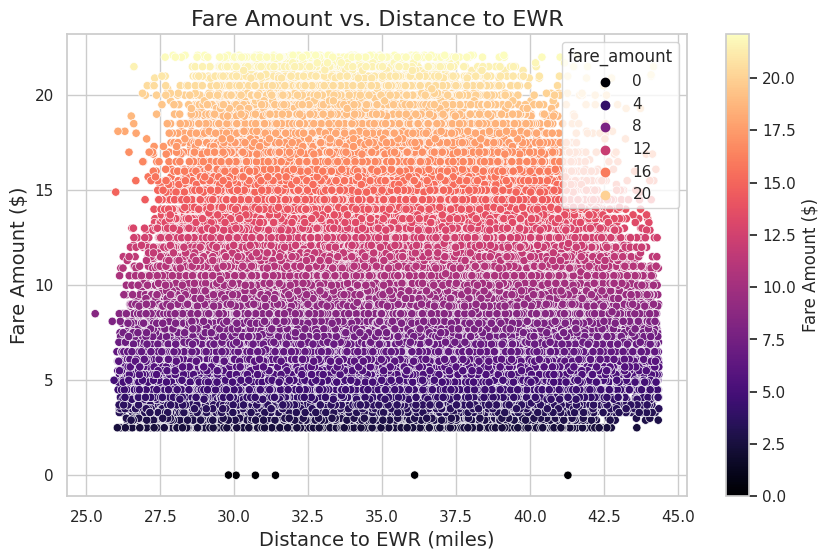

In [80]:
plt.figure(figsize=(10, 6))
scatter = sns.scatterplot(data=df_cleaned, x='ewr_dist', y='fare_amount', hue='fare_amount', palette='magma')
plt.title('Fare Amount vs. Distance to EWR', fontsize=16)
plt.xlabel('Distance to EWR (miles)', fontsize=14)
plt.ylabel('Fare Amount ($)', fontsize=14)
norm = plt.Normalize(df_cleaned['fare_amount'].min(), df_cleaned['fare_amount'].max())
sm = plt.cm.ScalarMappable(cmap='magma', norm=norm)
sm.set_array([])
plt.colorbar(sm, label='Fare Amount ($)')
plt.show()

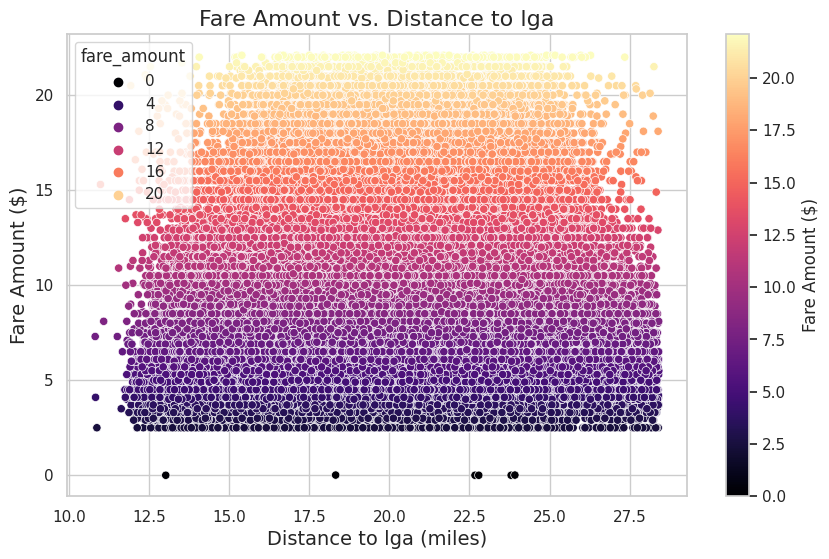

In [81]:
sns.set(style="whitegrid")

# Create the scatter plot
plt.figure(figsize=(10, 6))  # Set the figure size
scatter = sns.scatterplot(data=df_cleaned, x='lga_dist', y='fare_amount', hue='fare_amount', palette='magma')

# Add title and labels
plt.title('Fare Amount vs. Distance to lga', fontsize=16)
plt.xlabel('Distance to lga (miles)', fontsize=14)
plt.ylabel('Fare Amount ($)', fontsize=14)

# Add a colorbar
norm = plt.Normalize(df_cleaned['fare_amount'].min(), df_cleaned['fare_amount'].max())
sm = plt.cm.ScalarMappable(cmap='magma', norm=norm)
sm.set_array([])
plt.colorbar(sm, label='Fare Amount ($)')

# Show the plot
plt.show()

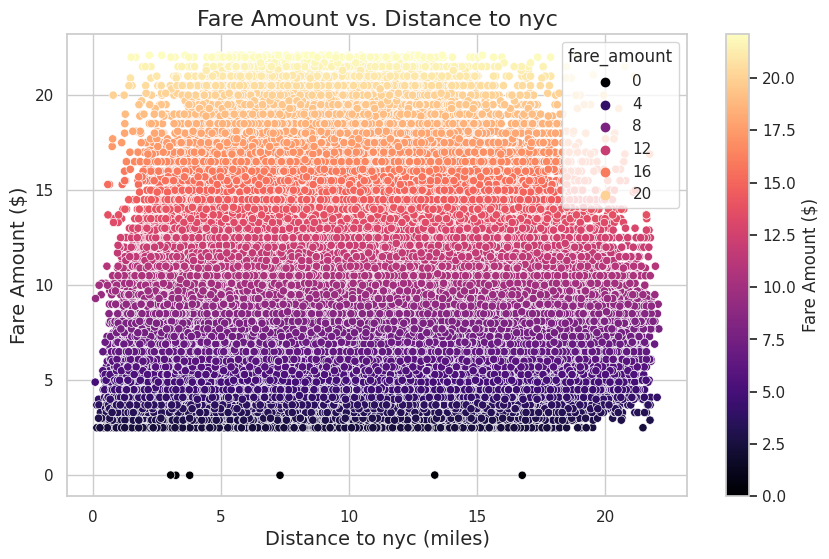

In [82]:
sns.set(style="whitegrid")

# Create the scatter plot
plt.figure(figsize=(10, 6))  # Set the figure size
scatter = sns.scatterplot(data=df_cleaned, x='nyc_dist', y='fare_amount', hue='fare_amount', palette='magma')

# Add title and labels
plt.title('Fare Amount vs. Distance to nyc', fontsize=16)
plt.xlabel('Distance to nyc (miles)', fontsize=14)
plt.ylabel('Fare Amount ($)', fontsize=14)

# Add a colorbar
norm = plt.Normalize(df_cleaned['fare_amount'].min(), df_cleaned['fare_amount'].max())
sm = plt.cm.ScalarMappable(cmap='magma', norm=norm)
sm.set_array([])
plt.colorbar(sm, label='Fare Amount ($)')

# Show the plot
plt.show()

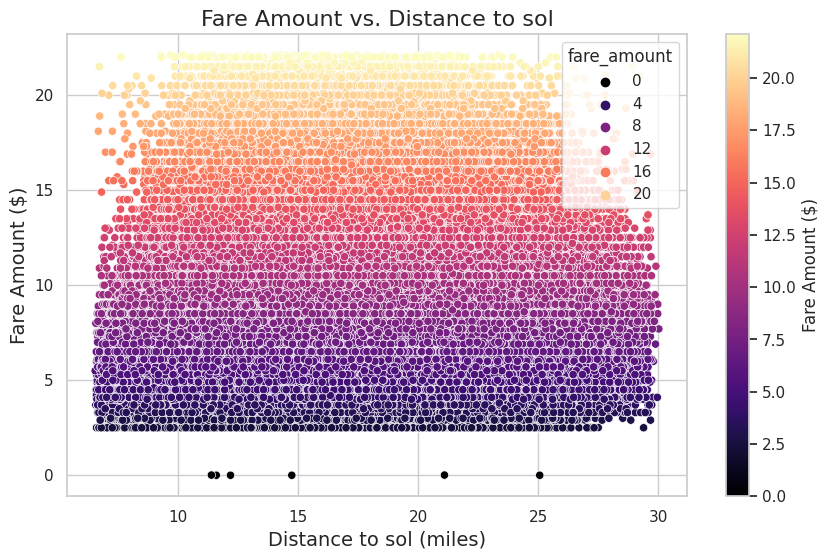

In [83]:
sns.set(style="whitegrid")

# Create the scatter plot
plt.figure(figsize=(10, 6))  # Set the figure size
scatter = sns.scatterplot(data=df_cleaned, x='sol_dist', y='fare_amount', hue='fare_amount', palette='magma')

# Add title and labels
plt.title('Fare Amount vs. Distance to sol', fontsize=16)
plt.xlabel('Distance to sol (miles)', fontsize=14)
plt.ylabel('Fare Amount ($)', fontsize=14)

# Add a colorbar
norm = plt.Normalize(df_cleaned['fare_amount'].min(), df_cleaned['fare_amount'].max())
sm = plt.cm.ScalarMappable(cmap='magma', norm=norm)
sm.set_array([])
plt.colorbar(sm, label='Fare Amount ($)')

# Show the plot
plt.show()

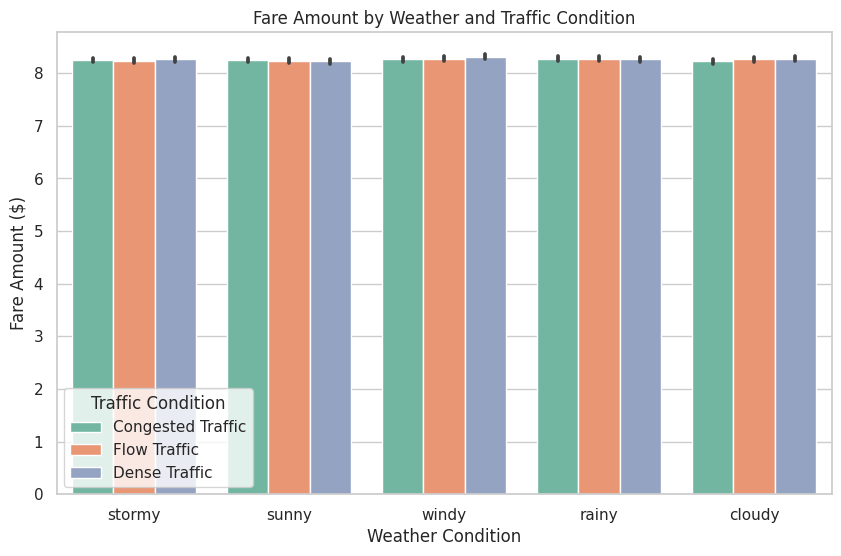

In [85]:
plt.figure(figsize=(10, 6))
sns.barplot(data=df_cleaned, x='Weather', y='fare_amount', hue='Traffic Condition', palette='Set2')
plt.title('Fare Amount by Weather and Traffic Condition')
plt.xlabel('Weather Condition')
plt.ylabel('Fare Amount ($)')
plt.legend(title='Traffic Condition')
plt.show()

In [87]:
df_cleaned.columns

Index(['Car Condition', 'Weather', 'Traffic Condition', 'fare_amount',
       'pickup_longitude', 'pickup_latitude', 'dropoff_longitude',
       'dropoff_latitude', 'passenger_count', 'jfk_dist', 'ewr_dist',
       'lga_dist', 'sol_dist', 'nyc_dist', 'distance', 'bearing',
       'pickup_hour', 'pickup_day', 'pickup_month', 'pickup_year',
       'pickup_weekday'],
      dtype='object')

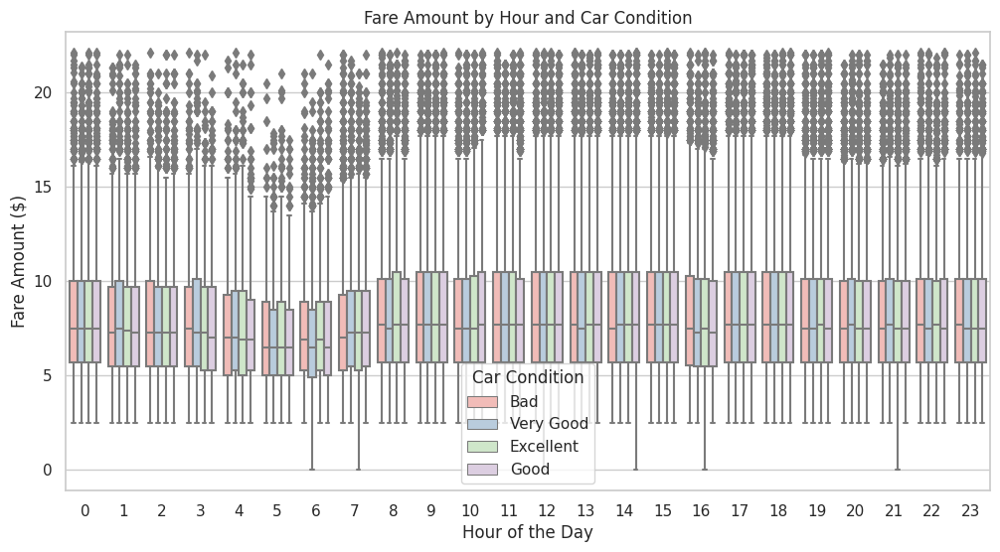

In [88]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_cleaned, x='pickup_hour', y='fare_amount', hue='Car Condition', palette='Pastel1')
plt.title('Fare Amount by Hour and Car Condition')
plt.xlabel('Hour of the Day')
plt.ylabel('Fare Amount ($)')
plt.legend(title='Car Condition')
plt.show()

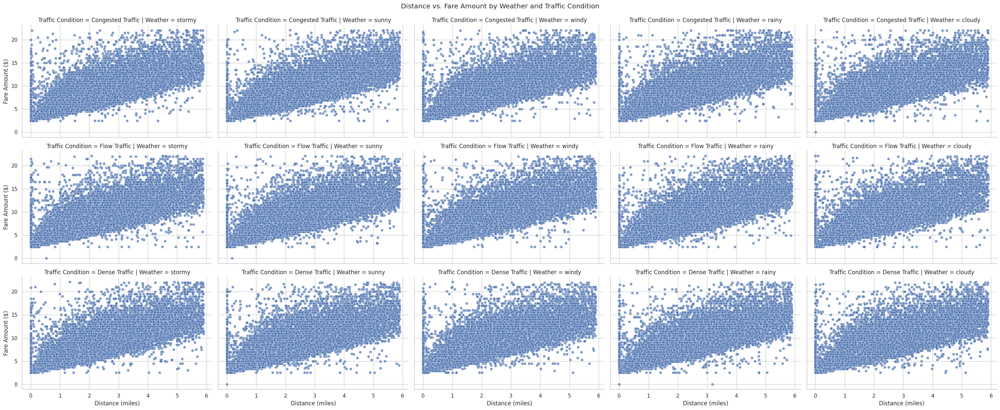

In [89]:
g = sns.FacetGrid(df_cleaned, col='Weather', row='Traffic Condition', height=4, aspect=1.5)
g.map(sns.scatterplot, 'distance', 'fare_amount', alpha=0.7)
g.set_axis_labels('Distance (miles)', 'Fare Amount ($)')
g.fig.suptitle('Distance vs. Fare Amount by Weather and Traffic Condition', y=1.02)
plt.show()

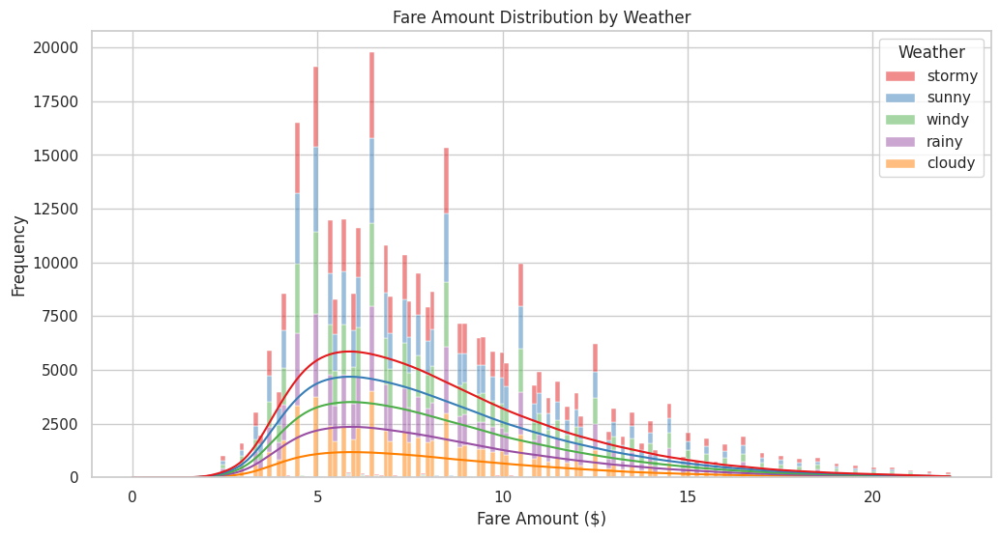

In [90]:
plt.figure(figsize=(12, 6))
sns.histplot(data=df_cleaned, x='fare_amount', hue='Weather', kde=True, palette='Set1', multiple='stack')
plt.title('Fare Amount Distribution by Weather')
plt.xlabel('Fare Amount ($)')
plt.ylabel('Frequency')
# plt.legend(title='Weather')
plt.show()

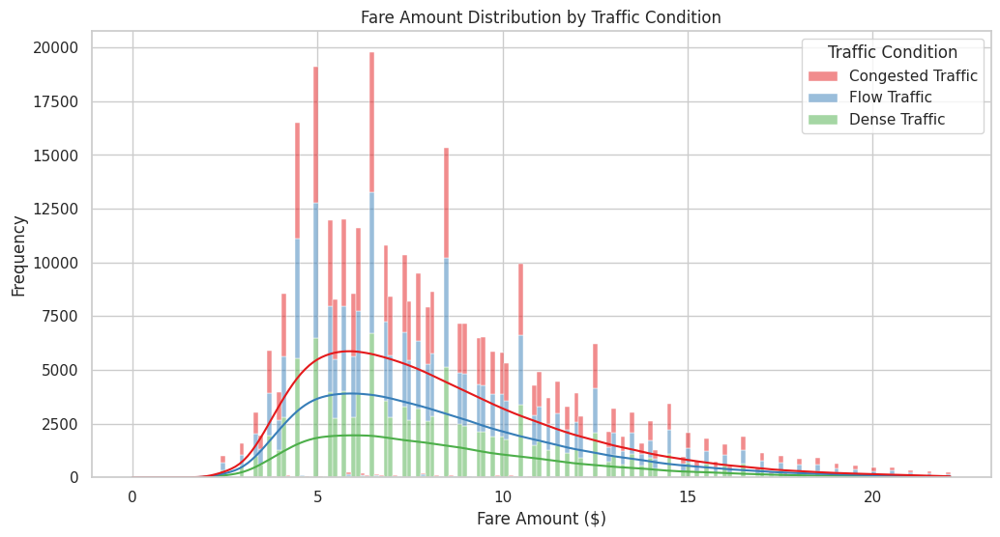

In [116]:
plt.figure(figsize=(12, 6))
sns.histplot(data=df_cleaned, x='fare_amount', hue='Traffic Condition', kde=True, palette='Set1', multiple='stack')
plt.title('Fare Amount Distribution by Traffic Condition')
plt.xlabel('Fare Amount ($)')
plt.ylabel('Frequency')
# plt.legend(title='Traffic Condition')
plt.show()

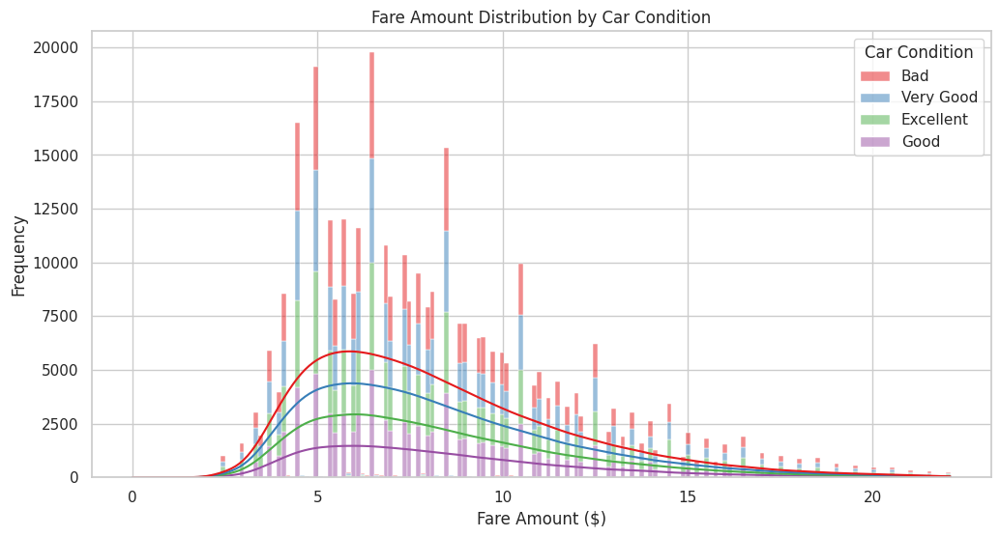

In [117]:
plt.figure(figsize=(12, 6))
sns.histplot(data=df_cleaned, x='fare_amount', hue='Car Condition', kde=True, palette='Set1', multiple='stack')
plt.title('Fare Amount Distribution by Car Condition')
plt.xlabel('Fare Amount ($)')
plt.ylabel('Frequency')
# plt.legend(title='Traffic Condition')
plt.show()

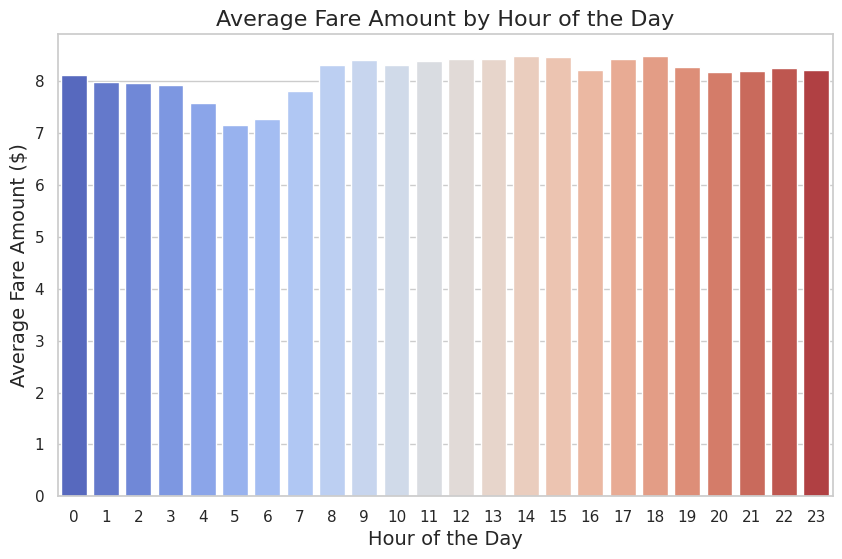

In [120]:

# Group by hour and calculate average fare amount
df_hour = df_cleaned.groupby('pickup_hour')['fare_amount'].mean().reset_index()

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(data=df_hour, x='pickup_hour', y='fare_amount', palette='coolwarm')
plt.title('Average Fare Amount by Hour of the Day', fontsize=16)
plt.xlabel('Hour of the Day', fontsize=14)
plt.ylabel('Average Fare Amount ($)', fontsize=14)
plt.show()

In [93]:
df_cleaned

,Car Condition,Weather,Traffic Condition,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,jfk_dist,...,lga_dist,sol_dist,nyc_dist,distance,bearing,pickup_hour,pickup_day,pickup_month,pickup_year,pickup_weekday
2,Bad,stormy,Congested Traffic,5.7,-1.291242,0.711418,-1.291391,0.711231,2,43.597686,...,19.865289,17.722624,9.847344,1.389525,2.599961,0,18,8,2011,3
3,Very Good,stormy,Flow Traffic,7.7,-1.291319,0.710927,-1.291396,0.711363,1,42.642965,...,21.063132,15.738963,7.703421,2.799270,0.133905,4,21,4,2012,5
4,Bad,stormy,Congested Traffic,5.3,-1.290987,0.711536,-1.290787,0.711811,1,43.329953,...,15.219339,23.732406,15.600745,1.999157,-0.502703,7,9,3,2010,1
5,Excellent,sunny,Congested Traffic,12.1,-1.291560,0.710901,-1.291071,0.711365,1,42.335622,...,20.648176,15.741133,7.649541,3.787239,-0.674251,9,6,1,2011,3
6,Excellent,windy,Flow Traffic,7.5,-1.291195,0.711251,-1.291086,0.711481,1,42.563234,...,18.113693,19.126670,10.993150,1.555807,-0.342260,20,20,11,2012,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499989,Bad,sunny,Congested Traffic,15.7,-1.290671,0.711749,-1.291419,0.711215,1,43.045475,...,17.103925,20.882032,12.849483,4.958925,2.326242,8,10,9,2009,3
499991,Excellent,rainy,Dense Traffic,6.0,-1.291267,0.711002,-1.291350,0.711189,1,41.852444,...,20.704710,15.442596,7.243390,1.258712,0.324497,0,1,5,2014,3
499995,Bad,rainy,Dense Traffic,7.0,-1.291173,0.711514,-1.290951,0.711371,1,42.565403,...,17.157511,20.401068,12.280187,1.404709,-2.275706,18,7,5,2015,3
499996,Very Good,rainy,Flow Traffic,13.7,-1.291595,0.710670,-1.291708,0.710540,1,41.814877,...,26.463167,8.596656,0.994796,0.994184,2.556931,12,13,9,2010,0


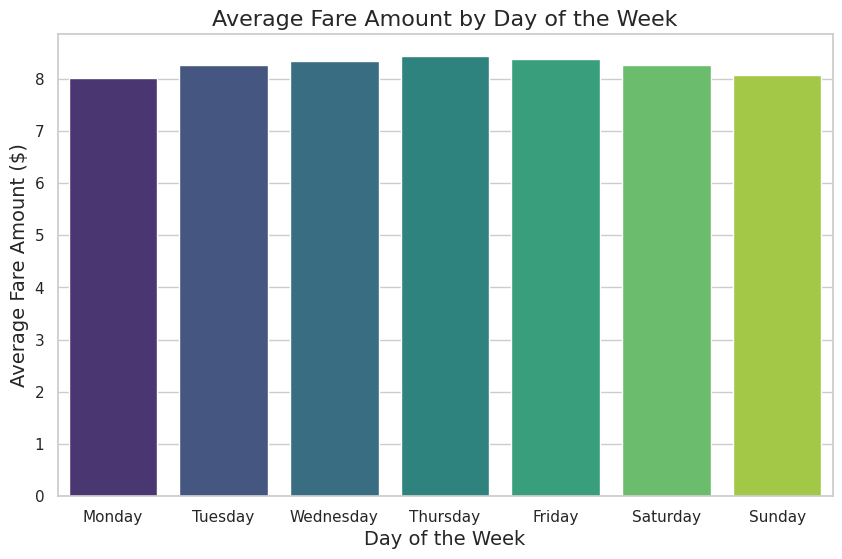

In [96]:
# Extract day of the week from pickup datetime
df_cleaned['day_of_week'] = df['pickup_datetime'].dt.day_name()

# Group by day of the week and calculate average fare amount
df_day = df_cleaned.groupby('day_of_week')['fare_amount'].mean().reset_index()

# Order days of the week
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df_day['day_of_week'] = pd.Categorical(df_day['day_of_week'], categories=day_order, ordered=True)
df_day = df_day.sort_values('day_of_week')

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(data=df_day, x='day_of_week', y='fare_amount', palette='viridis')
plt.title('Average Fare Amount by Day of the Week', fontsize=16)
plt.xlabel('Day of the Week', fontsize=14)
plt.ylabel('Average Fare Amount ($)', fontsize=14)
plt.show()

In [97]:
df_day['day_of_week']

1       Monday
5      Tuesday
6    Wednesday
4     Thursday
0       Friday
2     Saturday
3       Sunday
Name: day_of_week, dtype: category
Categories (7, object): ['Monday' < 'Tuesday' < 'Wednesday' < 'Thursday' < 'Friday' < 'Saturday' < 'Sunday']

In [98]:
df_day

,day_of_week,fare_amount
1,Monday,8.018381
5,Tuesday,8.257078
6,Wednesday,8.339077
4,Thursday,8.428802
0,Friday,8.377088
2,Saturday,8.256100
3,Sunday,8.068850


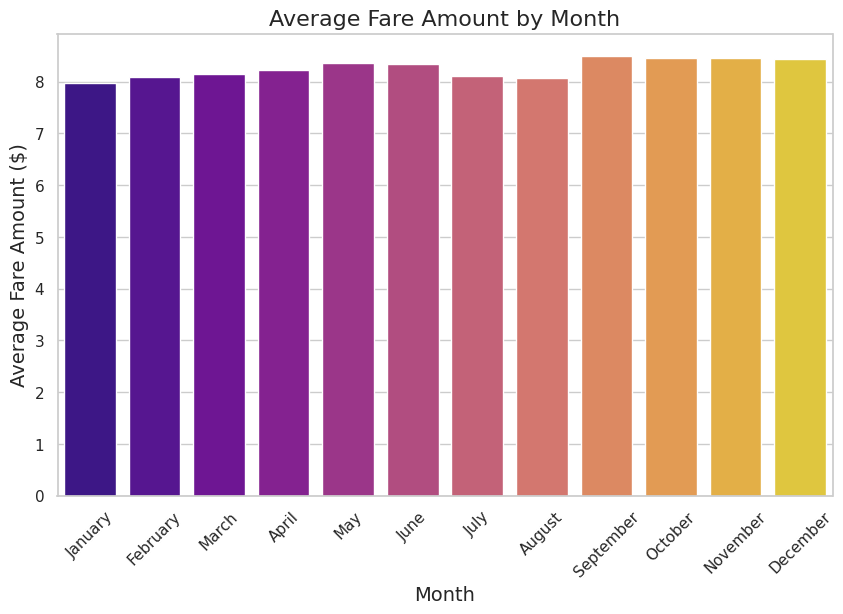

In [106]:
# Extract month from pickup datetime
df_cleaned['month'] = df['pickup_datetime'].dt.month_name()

# Group by month and calculate average fare amount
df_month = df_cleaned.groupby('month')['fare_amount'].mean().reset_index()

# Order months
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 
               'July', 'August', 'September', 'October', 'November', 'December']
df_month['month'] = pd.Categorical(df_month['month'], categories=month_order, ordered=True)
df_month = df_month.sort_values('month')

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(data=df_month, x='month', y='fare_amount', palette='plasma')
plt.title('Average Fare Amount by Month', fontsize=16)
plt.xlabel('Month', fontsize=14)
plt.ylabel('Average Fare Amount ($)', fontsize=14)
plt.xticks(rotation=45)
plt.show()

In [107]:
df_cleaned.columns

Index(['Car Condition', 'Weather', 'Traffic Condition', 'fare_amount',
       'pickup_longitude', 'pickup_latitude', 'dropoff_longitude',
       'dropoff_latitude', 'passenger_count', 'jfk_dist', 'ewr_dist',
       'lga_dist', 'sol_dist', 'nyc_dist', 'distance', 'bearing',
       'pickup_hour', 'pickup_day', 'pickup_month', 'pickup_year',
       'pickup_weekday', 'day_of_week', 'month'],
      dtype='object')

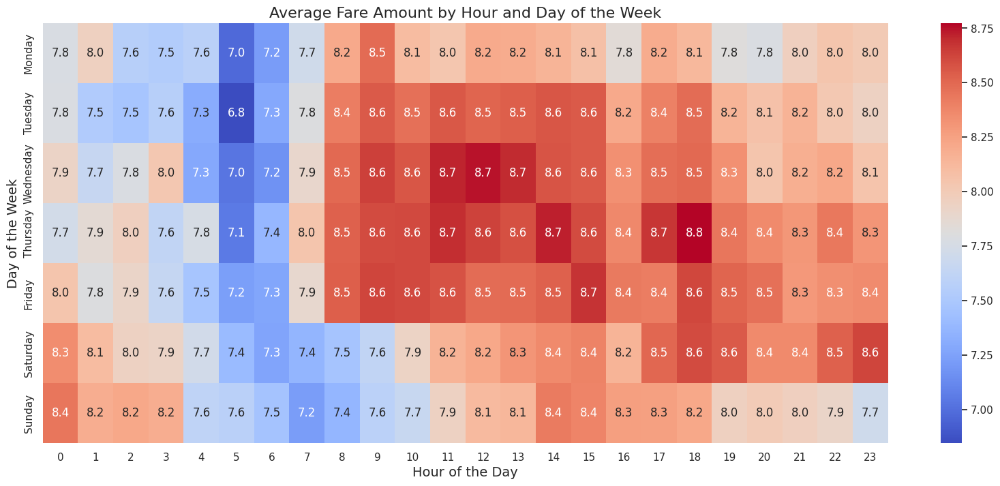

In [108]:


# Group by hour and day of the week
df_heatmap = df_cleaned.groupby(['day_of_week', 'pickup_hour'])['fare_amount'].mean().reset_index()

# Pivot the data for the heatmap
df_heatmap_pivot = df_heatmap.pivot(index='day_of_week', columns='pickup_hour', values='fare_amount')

# Order days of the week
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df_heatmap_pivot = df_heatmap_pivot.reindex(day_order)

# Plot
plt.figure(figsize=(20, 8))
sns.heatmap(df_heatmap_pivot, cmap='coolwarm', annot=True, fmt='.1f')
plt.title('Average Fare Amount by Hour and Day of the Week', fontsize=16)
plt.xlabel('Hour of the Day', fontsize=14)
plt.ylabel('Day of the Week', fontsize=14)
plt.show()

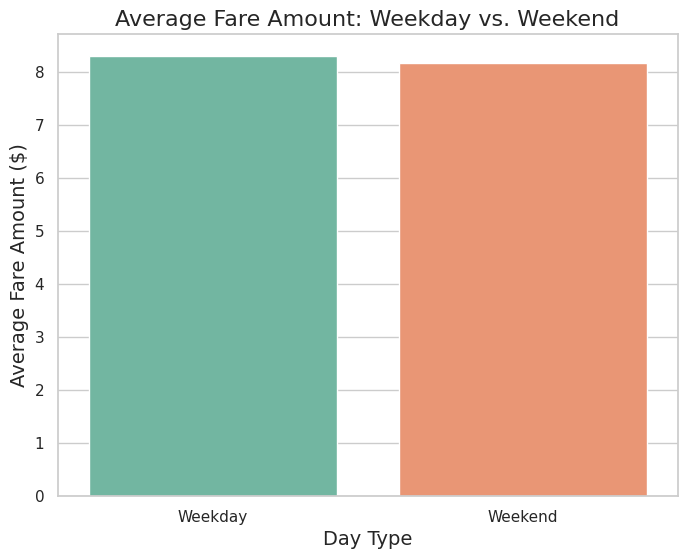

In [109]:
# Add a column to distinguish weekdays and weekends
df_cleaned['is_weekend'] = df['pickup_datetime'].dt.dayofweek >= 5  # 5 and 6 are Saturday and Sunday

# Group by weekday/weekend and calculate average fare amount
df_weekend = df_cleaned.groupby('is_weekend')['fare_amount'].mean().reset_index()
df_weekend['is_weekend'] = df_weekend['is_weekend'].map({False: 'Weekday', True: 'Weekend'})

# Plot
plt.figure(figsize=(8, 6))
sns.barplot(data=df_weekend, x='is_weekend', y='fare_amount', palette='Set2')
plt.title('Average Fare Amount: Weekday vs. Weekend', fontsize=16)
plt.xlabel('Day Type', fontsize=14)
plt.ylabel('Average Fare Amount ($)', fontsize=14)
plt.show()

In [110]:
df_weekend

,is_weekend,fare_amount
0,Weekday,8.292562
1,Weekend,8.171992


In [112]:
df_cleaned['is_weekend'].value_counts()

is_weekend
False    248699
True      92763
Name: count, dtype: int64

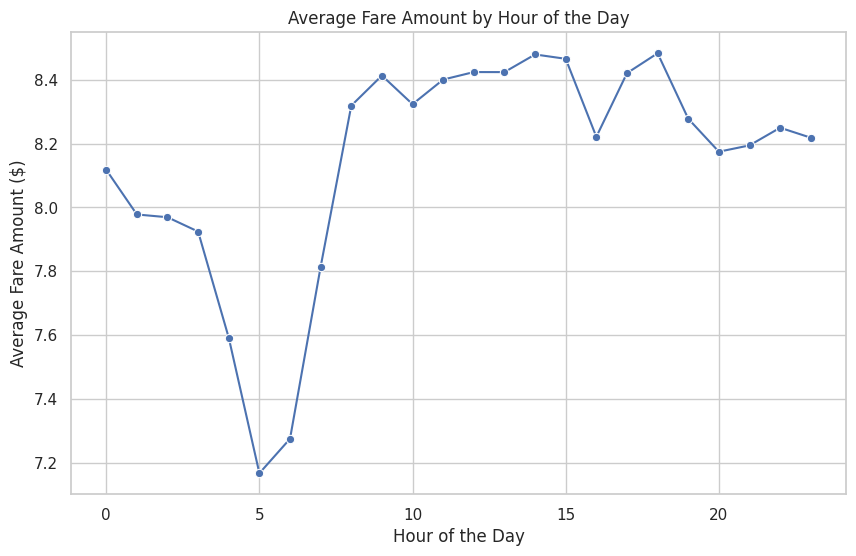

In [113]:
# Group by hour and calculate average fare amount
df_hour = df_cleaned.groupby('pickup_hour')['fare_amount'].mean().reset_index()

plt.figure(figsize=(10, 6))
sns.lineplot(data=df_hour, x='pickup_hour', y='fare_amount', marker='o', color='b')
plt.title('Average Fare Amount by Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Average Fare Amount ($)')
plt.grid(True)
plt.show()

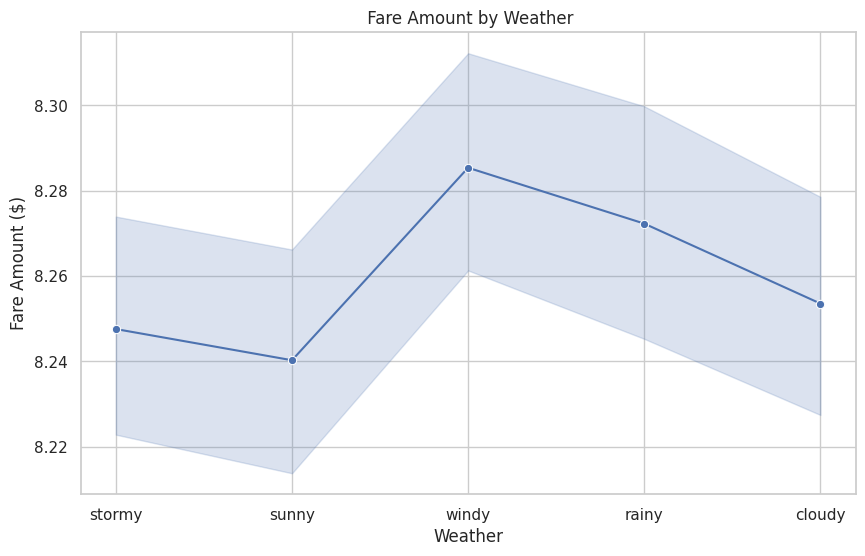

In [132]:

plt.figure(figsize=(10, 6))
sns.lineplot(data=df_cleaned, x='Weather', y='fare_amount', marker='o', color='b')
plt.title(' Fare Amount by Weather')
plt.xlabel('Weather')
plt.ylabel('Fare Amount ($)')
plt.grid(True)
plt.show()

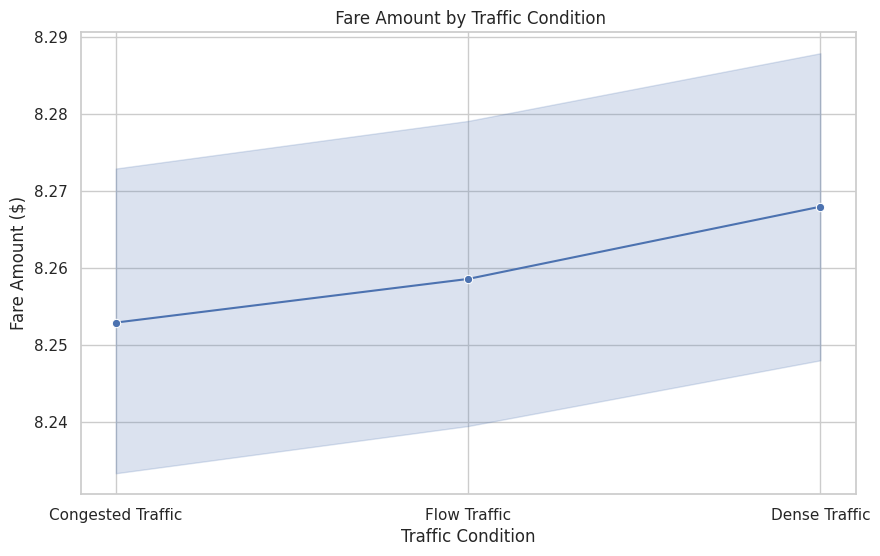

In [134]:
plt.figure(figsize=(10, 6))
sns.lineplot(data=df_cleaned, x='Traffic Condition', y='fare_amount', marker='o', color='b')
plt.title(' Fare Amount by Traffic Condition')
plt.xlabel('Traffic Condition')
plt.ylabel('Fare Amount ($)')
plt.grid(True)
plt.show()

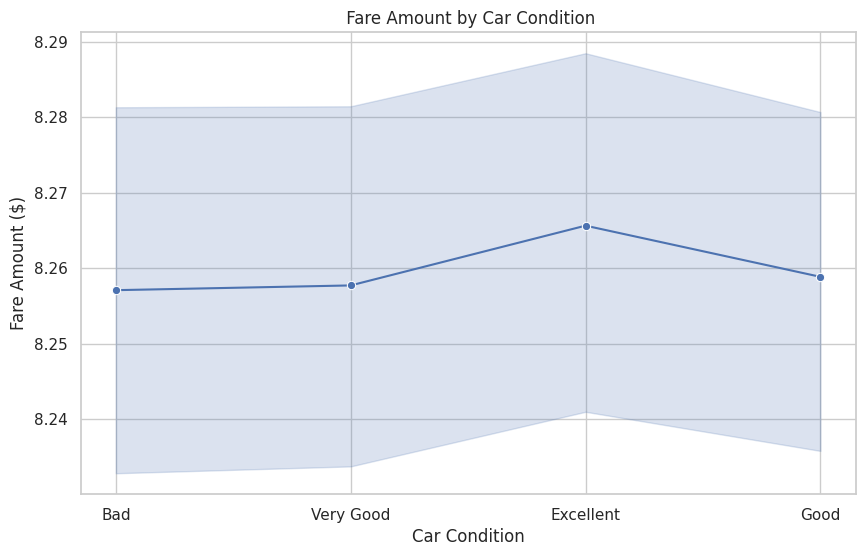

In [135]:
plt.figure(figsize=(10, 6))
sns.lineplot(data=df_cleaned, x='Car Condition', y='fare_amount', marker='o', color='b')
plt.title(' Fare Amount by Car Condition')
plt.xlabel('Car Condition')
plt.ylabel('Fare Amount ($)')
plt.grid(True)
plt.show()

In [129]:
def manhattan_distance(lat1, lon1, lat2, lon2):
    # Calculate absolute differences in latitude and longitude
    dlat = abs(lat1 - lat2)
    dlon = abs(lon1 - lon2)
    return dlat + dlon

# Apply the function to calculate Manhattan distance
df_cleaned['manhattan_distance'] = df_cleaned.apply(
    lambda row: manhattan_distance(row['pickup_latitude'], row['pickup_longitude'], 
                                      row['dropoff_latitude'], row['dropoff_longitude']), axis=1
)

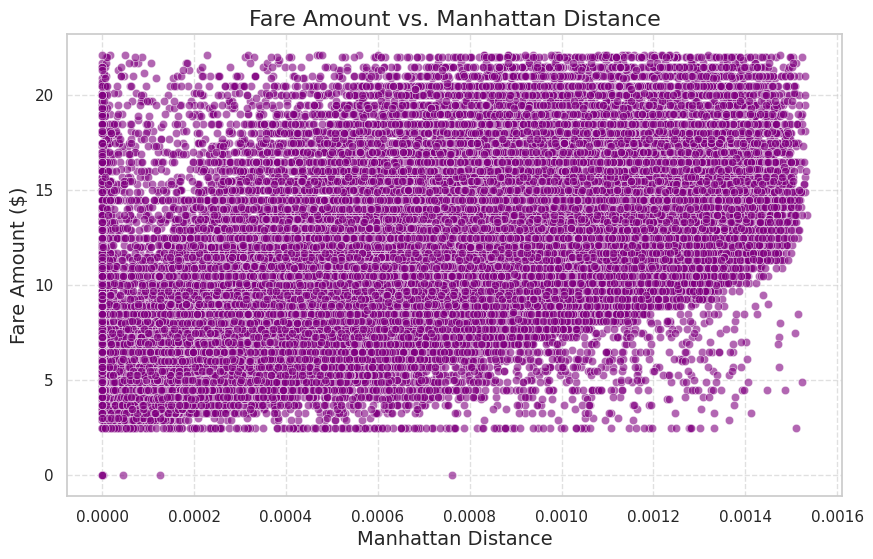

In [138]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_cleaned, x='manhattan_distance', y='fare_amount', alpha=0.6, color='purple')
plt.title('Fare Amount vs. Manhattan Distance', fontsize=16)
plt.xlabel('Manhattan Distance', fontsize=14)
plt.ylabel('Fare Amount ($)', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()